XC course ingestion comparison

In [1]:
from math import sqrt, floor

import datetime
import time
from math import sqrt, floor
import numpy as np
import pandas as pd
import haversine

# https://github.com/christopherbronner/gps-run-tracker/blob/master/GPS%20tracker.ipynb
import gpxpy
import gpxpy.gpx
from time import strftime
import matplotlib.pyplot as plt
import copy
from matplotlib.cm import terrain # import color map
from matplotlib.cm import cool # import color map

from geopy import distance as gpyd
from geographiclib.geodesic import Geodesic #for heading
geod = Geodesic.WGS84  # define the WGS84 ellipsoid
import gpx_interpolate #local file

from math import degrees, cos, sin, atan2 #for bearing calculations
from scipy.signal import find_peaks #for hairpin detection

import statistics #for standard deviation of turns
import os #to get files

from scipy.signal import savgol_filter
from scipy import stats # for zscore filtering pace
import seaborn as sns # seaborn for plotting

### Pull in the gps data

In [2]:
def gpxfile_to_lat_lon(path, filename):
    base=os.path.basename(path + filename)
    gpx_file = open(path + filename, 'r')
    gpx = gpxpy.parse(gpx_file)

    lat = []
    lon = []
    ele = []
    tstamp = []
    tzinfo = []

    for track in gpx.tracks:
        for segment in track.segments:
            for point in segment.points:
                lat.append(point.latitude)
                lon.append(point.longitude)
#                 df_newRow = pd.DataFrame([[point.time, point.latitude, point.longitude, point.elevation]], columns=['time','Lat','Lon','Elevation'])
#                 df = df.append(df_newRow, ignore_index=True)
                ele.append(point.elevation)
    return lat, lon, ele, gpx
#     files.append(filename)
#         courses.append(os.path.splitext(base)[0])

In [3]:
def gpxfile_to_gpx(path, filename):
    base=os.path.basename(path + filename)
    gpx_file = open(path + filename, 'r')
    gpx = gpxpy.parse(gpx_file)
    
    return gpx

In [4]:
def gpx_to_lat_lon(gpx):
    lat = []
    lon = []
    ele = []
    tstamp = []
    tzinfo = []

    for track in gpx.tracks:
        for segment in track.segments:
            for point in segment.points:
                lat.append(point.latitude)
                lon.append(point.longitude)
#                 df_newRow = pd.DataFrame([[point.time, point.latitude, point.longitude, point.elevation]], columns=['time','Lat','Lon','Elevation'])
#                 df = df.append(df_newRow, ignore_index=True)
                ele.append(point.elevation)
    return lat, lon, ele

In [5]:
# Loads gpx file and returns data frame run
def load_run_to_df(filename): 
    
    # Load file into run_data using gpxpy
    with open(filename) as f:
        run_data = gpxpy.parse(f)
    f.closed
    
    # Initialize DataFrames
    df_dict = {'time': [],'Lat': [],'Lon': [],'Elevation': []}
    df = pd.DataFrame(df_dict)
    
    # Create DataFrame containing time, latitude, longitude, elevation columns
    for track in run_data.tracks:
        for segment in track.segments:
            for point in segment.points:
                df_newRow = pd.DataFrame([[point.time, point.latitude, point.longitude, point.elevation]], columns=['time','Lat','Lon','Elevation'])
                df = df.append(df_newRow, ignore_index=True)
    
    # Convert time to datetime
    df['time'] = pd.to_datetime(df['time'])
    # Create additional column for accumulative distance
    df = add_distance(df)
    
    alt_dif = [0]
    time_dif = [0]
########################################
    #adding alt and time
    data = run_data.tracks[0].segments[0].points
    for index in range(len(data)):
        if index == 0:
            pass
        else:
            start = data[index-1]
            stop = data[index]

            alt_d = start.elevation - stop.elevation
            alt_dif.append(alt_d)

            try:
                time_delta = (stop.time - start.time).total_seconds()
            except:
                #no time in data
                time_delta = 0

            time_dif.append(time_delta)

    df1 = pd.DataFrame()
    df1['alt_dif'] = alt_dif
    df1['time_dif'] = time_dif

    print('Total Time : ', floor(sum(time_dif)/60),' min ', int(sum(time_dif)%60),' sec ')
    df = pd.concat([df, df1], axis=1)
########################################

    return df

# path_bayfront = '/Users/jeremywalsh/Documents/Projects/XC/XCCourseAnalysis/Courses/Bayfront Park 7km.gpx'
# df = load_run_to_df(path_bayfront)
# df.head()

# # Calculate total distance of this run
# total_distance = df.iloc[-1]['Distance']    
# print('Total distance: \t%.2f km' % total_distance)

In [6]:
lon1 = 43
lat1 = 0
lon2 = 43
lat2 = 75

In [7]:
# x = 7
bearing_tmp = atan2(sin(lon2-lon1)*cos(lat2), cos(lat1)*sin(lat2)-sin(lat1)*cos(lat2)*cos(lon2-lon1))
print(degrees(bearing_tmp))
print(bearing_tmp*180/3.1415)
print((degrees(bearing_tmp)+360)%360)

geod = Geodesic.WGS84
g = geod.Inverse(lat1,lon1, lat2, lon2)
print(g['azi1'])
print((g['azi1']+360)%360)


180.0
180.00530881622242
180.0
0.0
0.0


In [11]:
def angle_between_points(lat, lon):
    #calculate angle between points
    #lat and lon are lists of points   
    #returns angle in degrees
    #print(lat)
    #print(lon)
    bearing_tmp = atan2(sin(lon[1]-lon[0])*cos(lat[1]), cos(lat[0])*sin(lat[1])-sin(lat[0])*cos(lat[1])*cos(lon[1]-lon[0]))
    return degrees(bearing_tmp)
    
    
def angle_between(df):
    # Calculate bearing between each point
    df['Bearing'] = df.apply(lambda row: angle_between_points(row['Lat'], row['Lon']), axis=1)
    return df  


## Get the heading

In [12]:
def angle_diff(df, window):
    bearing = []
    p2p_distance = []

    for i in range(len(df['Lon'])-1):
        lon1 = df['Lon'].values[i]
        lat1 = df['Lat'].values[i]
        lon2 = df['Lon'].values[i+1]
        lat2 = df['Lat'].values[i+1]

        # bearing_tmp = atan2(sin(lon2-lon1)*cos(lat2), cos(lat1)*sin(lat2)-sin(lat1)*cos(lat2)*cos(lon2-lon1))
        # bearing_tmp = degrees(bearing_tmp)
        # bearing_tmp = (bearing_tmp + 360) % 360
        # bearing.append(bearing_tmp)
        geod = Geodesic.WGS84
        g = geod.Inverse(lat1,lon1, lat2, lon2)
        bearing.append((g['azi1']+360)%360)


    #     bearing.append(Geodesic.WGS84.Inverse(lon1, lat1, lon2, lat2)['azi1']) #degrees clockwise from north)
        p2p_distance.append(Geodesic.WGS84.Inverse(lon1, lat1, lon2, lat2)['s12']) #distance between each point in meters
    
    #smoothing the bearing since for some tracks it is messy and throws off hairpin detection
#     bearing = savgol_filter(bearing, 41, 2) # window size 51, polynomial order 2
    
    # bearing.insert(0, np.nan) #making the same length as df
    p2p_distance.insert(0, 0) #making the same length as df
    p2p_distance = np.cumsum(p2p_distance)


    bearing_diff = [bearing[i + 1] - bearing[i] for i in range(len(bearing)-1)]
    angle_diff = [(bearing_diff[i] + 180) % 360 - 180 for i in range(len(bearing)-1)]

    angle_df = pd.DataFrame(angle_diff).rolling(window=window, center=True).sum()
    angle_df = angle_df.abs() # taking the absolute value so we get all the peask

    angle_df.loc[-1] = [np.nan]
    angle_df.loc[-2] = [np.nan]

    angle_df.index = angle_df.index + 3  # shifting index
    angle_df.sort_index(inplace=True) 

    df['angle_diff'] = angle_df[0]
    return df, bearing

## Hairpin turn detection via bearing angle difference peak detection

In [13]:
from bokeh.plotting import figure
from bokeh.io import output_notebook, push_notebook, show
output_notebook()

Loading BokehJS ...

In [14]:
def hairpin_detection(df, height, bearing, course):
    peaks, _ = find_peaks(df['angle_diff'], height=height, prominence=50)
    print('Number of hairpins in course')
    print(len(peaks))
    
#     plot it
    fig = plt.figure(figsize=(20,8))
    plt.plot(df['angle_diff'])
    plt.plot(bearing)
    
    plt.scatter(peaks, df['angle_diff'].iloc[peaks])
    plt.title('Bearing and Bearing Changes - ' + str(course))
    plt.show()
    
    # bokeh
    # Create the figure: p
    p = figure(title='Course Map with Hairpins - ' + str(course), x_axis_label='Lon', y_axis_label='Lat', plot_width=500, plot_height=500)
    # Add a circle glyph to the figure p
    p.circle(df['Lon'], df['Lat'], size = 0.5)
    p.circle(df['Lon'].iloc[peaks], df['Lat'].iloc[peaks], color='red', size = 10, alpha=0.8)
    # Display the plot
    show(p)
    
    
    print('Standard Deviation')
    st_dev = statistics.stdev(df['angle_diff'].dropna())
    print(st_dev)
    print('Total Degrees Turned')
    tot_deg_turned = sum([abs(ele) for ele in df['angle_diff'].dropna()])
    print(tot_deg_turned)
    
    return st_dev, tot_deg_turned, len(peaks)

In [15]:
from scipy.signal import argrelextrema

def plot_ele_max_min(df):
    # Plot results
    fig = plt.figure(figsize=(20,8))
    plt.scatter(df['dis_hav_3d'], df['min'], c='r')
    plt.scatter(df['dis_hav_3d'], df['max'], c='g')
    plt.plot(df['dis_hav_3d'], df['Elevation'])
    plt.show()

## Calculate Course Area
Look at the total area the course covers as a comparison for how turny the course is. ie how good is the course/race director at minimizing turns (if that was a desired goal).

In [16]:
def course_area(geod, df):
    p = geod.Polygon()
    for pnt in range(len(df)):
        if pnt == 0:
            continue
        p.AddPoint(df['Lat'][pnt], df['Lon'][pnt])

    num, perim, area = p.Compute()
    print("Race Distance/area of the course are {:.3f} m / {:.1f} m^2".format(perim, area))
    return perim, area

In [17]:
def hills(df):
    n=20 # number of points to be checked before and after 
    # Find local peaks
    df['min'] = df.iloc[argrelextrema(df['Elevation'].values, np.less_equal, order=n)[0]]['Elevation']
    df['max'] = df.iloc[argrelextrema(df['Elevation'].values, np.greater_equal, order=n)[0]]['Elevation']

    max_locs = df['max'].index.get_indexer(df['max'].index[~df['max'].isnull()]) #index locations of the max's
    min_locs = df['min'].index.get_indexer(df['min'].index[~df['min'].isnull()]) #index locations of the min's

    #min locs remove duplicates
    for i in range(len(min_locs)):
        if i == len(min_locs)-1: #skip the last one
            continue
        else:
            if min_locs[i] == min_locs[i+1]-1: #check if it is the same as the previous one
                df['min'][min_locs[i]] = np.nan #setting it to nan so we don't have duplicates

    min_locs = df['min'].index.get_indexer(df['min'].index[~df['min'].isnull()])

    #max locs remove duplicates
    for i in range(len(max_locs)):
        if i == len(max_locs)-1: #skip the last one
            continue
        else:
            if max_locs[i] == max_locs[i+1]-1: #check if it is the same as the previous one
                df['max'][max_locs[i]] = np.nan #setting it to nan so we don't have duplicates

    max_locs = df['max'].index.get_indexer(df['max'].index[~df['max'].isnull()])
    
    # get the hill climbs
    min_vals = []
    max_vals = []
    hill_climbs = []
    hill_lengths = []

    for i in range(len(max_locs)): #loop through each max location
        if i == len(max_locs)-1: #skip the last one to avoid out of range error b/c zero index
            continue
        else:
            min_val = df['min'][min_locs[i]] #get this hill's min elevation
            max_val = df['max'][max_locs[i]] #get this hill's max elevation
            hill_climb = max_val - min_val #get the hill climb amount

            hill_start = df['dis_hav_3d'][min_locs[i]] #get this hill's start point
            hill_end = df['dis_hav_3d'][max_locs[i]] #get this hill's end point
            hill_length = hill_end - hill_start

            min_vals.append(min_val)
            max_vals.append(max_val)
            hill_climbs.append(hill_climb)
            hill_lengths.append(hill_length)
            
    plot_ele_max_min(df)
        
    return min_vals, max_vals, hill_climbs, hill_lengths, df

In [18]:
def hill_details(df, peaks, mins):
    #if the first point is a peak then set the start as the min
    if len(peaks)>0 and peaks[0]<mins[0]:
        mins = np.insert(mins, 0, 0)
        
    
    # get the hill climbs
    min_vals = []
    max_vals = []
    hill_climbs = []
    hill_lengths = []

    for i in range(len(peaks)): #loop through each max location
        try: #error handling for weird numbered hills
            min_val = df['Elevation'].iloc[mins[i]] #get this hill's min elevation
            max_val = df['Elevation'].iloc[peaks[i]] #get this hill's max elevation
            hill_climb = max_val - min_val #get the hill climb amount

            hill_start = df.index[mins[i]] #get this hill's start point
            hill_end = df.index[peaks[i]] #get this hill's end point
            hill_length = hill_end - hill_start

            min_vals.append(min_val)
            max_vals.append(max_val)
            hill_climbs.append(hill_climb)
            hill_lengths.append(hill_length)
        except:
            print('one hill error')
        
    return min_vals, max_vals, hill_climbs, hill_lengths

In [19]:
def positive_only(x):
    if x > 0:
        return x
    else:
        return 0
    
def myround(x, prec=1, base=0.5):
    return round(base * round(float(x)/base),prec)

In [20]:
def hills_peaks(df, prominence, distance, course):
    peaks, _ = find_peaks(df['Elevation'], prominence=prominence, distance=distance)
    mins, _ = find_peaks(-df['Elevation'], prominence=prominence, distance=distance)

#     plot it
    fig = plt.figure(figsize=(20,8))
#     plt.rcParams.update({'font.size': 22})
    plt.plot(df['Elevation'])
    plt.scatter(df.index[peaks], df['Elevation'].iloc[peaks], color='red')
    plt.scatter(df.index[mins], df['Elevation'].iloc[mins], color='blue')
    plt.title('Elevation and Peaks - ' + str(course))
    plt.show()
    
    #plot them on the course
    # bokeh
    p = figure(title='Course Map with Hill Peaks - ' + str(course), x_axis_label='Lon', y_axis_label='Lat', plot_width=500, plot_height=500)
    # Add a circle glyph to the figure p
    p.circle(df['Lon'], df['Lat'], size = 0.5)
    p.circle(df['Lon'].iloc[peaks], df['Lat'].iloc[peaks], color='red', size = 10, alpha=0.8)
    p.circle(df['Lon'].iloc[mins], df['Lat'].iloc[mins], color='blue', size = 10, alpha=0.8)
    # Display the plot
    show(p)
    
    st_dev = statistics.stdev(df['Elevation'].dropna())
    
    pos_only = list(map(positive_only, df['alt_dif']))
    tot_elev_gain = sum(list(map(lambda x: myround(x, prec=1, base=0.9) , pos_only)))
    tot_elev_gain_unfiltered = sum(pos_only)
    
    return st_dev, peaks, mins, tot_elev_gain, tot_elev_gain_unfiltered

In [21]:
def add_distance(df):
    tmp = [0]
#     for i, row in df[1:].iterrows():
    for i, item in enumerate(df.index):
        prevCoord = (df.iloc[i-1]['Lat'],df.iloc[i-1]['Lon'])
        currCoord = (df.iloc[i]['Lat'],df.iloc[i]['Lon'])
        tmp.append(tmp[-1] + gpyd.geodesic(prevCoord, currCoord).km)
    df['Distance']=tmp[1:]
    return df

# Need to fix pace, right now it's zeros

In [22]:
# Calculate current pace
def add_pace(df):

    #drop when distance change is zero for unknown reasons
    df = df[df['DistanceChangeInKM']!=0] 
    
    pace_hist = ((df['time_dif']/60)/df['DistanceChangeInKM']).values
    df['PaceInMinPerKM'] = pace_hist

    # remove spikes (if a value is more than spike_tolerace times larger than the mean of the surrounding values)
    spike_tolerance = 1.3
    pace_hist_nospikes = copy.copy(pace_hist)
    for i in range(len(pace_hist_nospikes)):
        if i>1 and i<(len(pace_hist_nospikes)-2):
            if pace_hist_nospikes[i] > spike_tolerance * np.mean([pace_hist_nospikes[i-2],pace_hist_nospikes[i-1],pace_hist_nospikes[i+1],pace_hist_nospikes[i+2]]):
                pace_hist_nospikes[i] = np.mean([pace_hist_nospikes[i-2],pace_hist_nospikes[i+2]])


    # running average of pace (without spikes), N is width of average    
    N = 23 # N must be 2n+1
    pace_hist_binned = np.convolve(pace_hist_nospikes, np.ones((N,))/N, mode='valid')
    
    # Add Pace
    df['pace']=np.nan
    df['pace'].iloc[int((N-1)/2):-int((N-1)/2)]=pace_hist_binned
    
    print(len(df))
    print(len(df.dropna()))
    print(len(df['pace'].dropna()))
    
    #drop outlier in pace (sometimes watch seems to be stopped early or late)
    df = df.dropna()[(np.abs(stats.zscore(df.dropna()['pace'])) < 3)]
    
    # Plot original pace trace in grey and spike-removed, averaged trace in red
    fig = plt.figure(figsize=(20, 8))
    #plt.plot(df['accuDist'][1:],pace_hist,'#dddddd')
#     plt.plot(df['accuDist'][1+int((N-1)/2):-int((N-1)/2)],pace_hist_binned,'r') #rolling average plot
#     plt.plot(df['accuDist'][1:],[avg_pace/60 for i in range(len(df['accuDist'][1:]))],'b') #average line
    plt.plot(df.index,df['pace'],'r') #rolling average plot
    plt.title('Pace')
    plt.ylabel('pace (min per km)')
    plt.xlabel('distance (km)')
    plt.show()
    
    return df

In [23]:
def elev_map(course, df):
    fig = plt.figure(figsize=(10, 10))
    plt.title(course + ' - Elevation')
    plt.scatter(x=df['Lat'], y=df['Lon'], c=df['Elevation'], cmap=plt.cm.inferno)
    plt.ylabel('Lon')
    plt.xlabel('Lat')
    buffer = 0.0001
    plt.xlim(df['Lat'].min()-buffer, df['Lat'].max()+buffer)
    plt.ylim(df['Lon'].min()-buffer, df['Lon'].max()+buffer)

    cbar = plt.colorbar()
    cbar.set_label('Elevation (m)')

    plt.show()

In [24]:
def pace_elev_map(course, df):
    fig = plt.figure(figsize=(10, 10))
    plt.title(course + ' - Elevation and Pace')
    # sc = plt.scatter(x=df['Lat'], y=df['Lon'], c=df['pace'], cmap=plt.cm.inferno, s = scaler.transform(df[['Elevation']])*50)
    h_min = df['Elevation'].min()
    h_const = 10 #constant to adjust the heights
    f = lambda a: a-h_min+h_const 
    g = lambda s: s+h_min-h_const
    sc = plt.scatter(x=df['Lat'], y=df['Lon'], c=df['pace'], cmap=plt.cm.inferno, s = f(df[['Elevation']].values))
    # sc = plt.scatter(x=df['Lat'], y=df['Lon'], c=df['pace'], cmap=plt.cm.inferno, s = df['Elevation'])
    plt.ylabel('Lon')
    plt.xlabel('Lat')
    buffer = 0.0001
    plt.xlim(df['Lat'].min()-buffer, df['Lat'].max()+buffer)
    plt.ylim(df['Lon'].min()-buffer, df['Lon'].max()+buffer)
    cbar = plt.colorbar()
    cbar.set_label('Pace (min)')

    plt.legend(*sc.legend_elements("sizes", num=5, func=g), title='Elevation (m)')

    plt.show()

In [25]:
def InterpolateGPS(df):
    FirstDistanceInKM = round(df.index[0],3)
    LastDistanceInKM = round(df.index[-1],3)
    df = df[~df.index.duplicated()] #some have duplicates that need to be removed
    df = df.reindex(df.index.union(np.linspace(FirstDistanceInKM, LastDistanceInKM,
                int((LastDistanceInKM-FirstDistanceInKM)*1000+1))))
    df.index = df.index.astype('float64')
    
    # Interpolate time
    #Cast date to seconds (also recast the NaT to Nan)
    df['seconds'] = [time.mktime(t.timetuple()) if t is not pd.NaT else float('nan') for t in df['time'] ]

    #Use the 'values'-argument to actually use the values of the index and not the spacing
    df['interpolated'] = df['seconds'].interpolate('values')
    #Cast the interpolated seconds back to datetime
    df['interpolated datetime']= pd.to_datetime(df['interpolated']-18000, unit='s', errors='coerce')

    #Clean up
    df['time'] = df['interpolated datetime']
    df.drop(columns=['interpolated datetime', 'interpolated', 'seconds'], inplace=True)

    # Interpolate everything else
    df = df.interpolate()
    return df

King City 10km.gpx
Total Time :  33  min  12  sec 
Number of hairpins in course
4


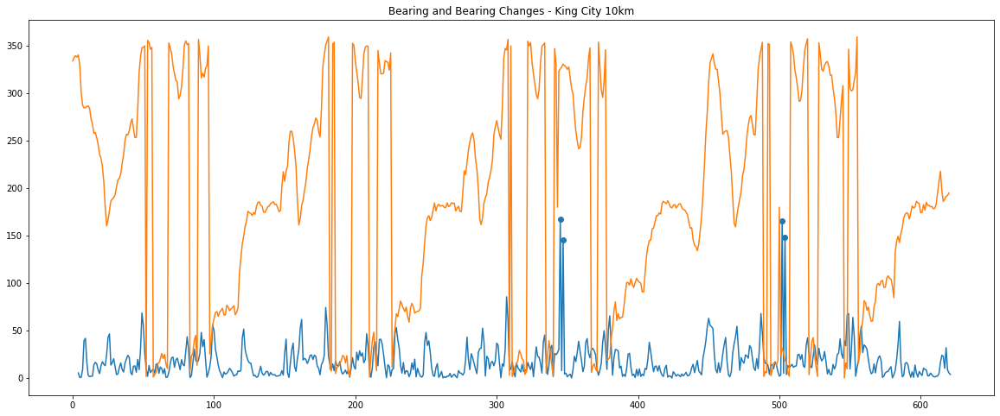

Standard Deviation
18.538448973815985
Total Degrees Turned
10872.224941729442
Race Distance/area of the course are 10038.908 m / -950170.4 m^2
10648
10571
10599


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


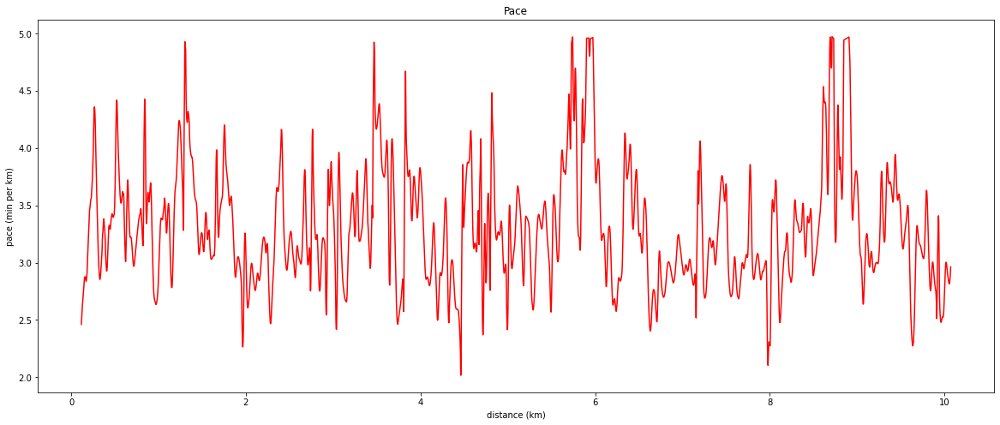

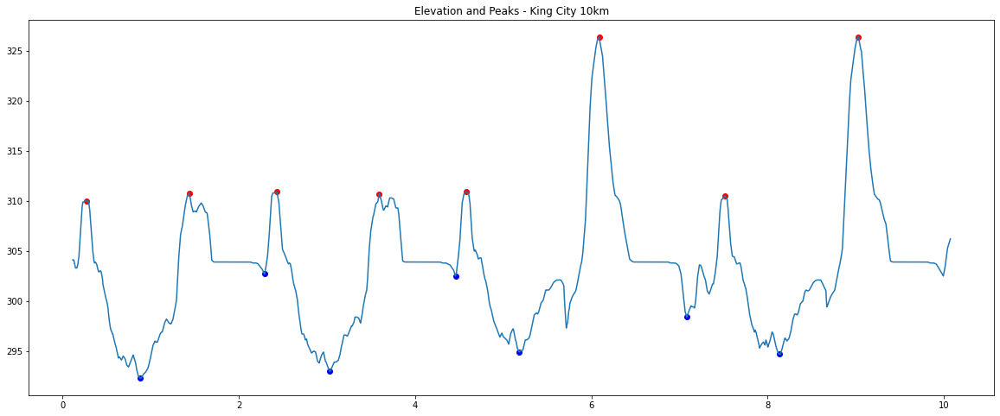

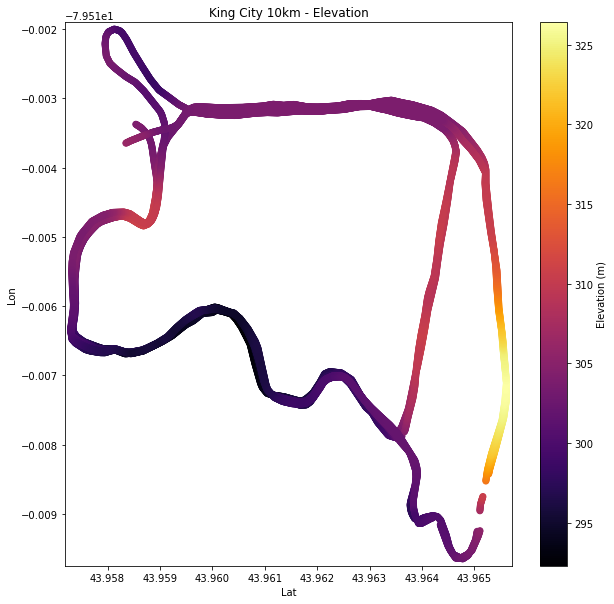

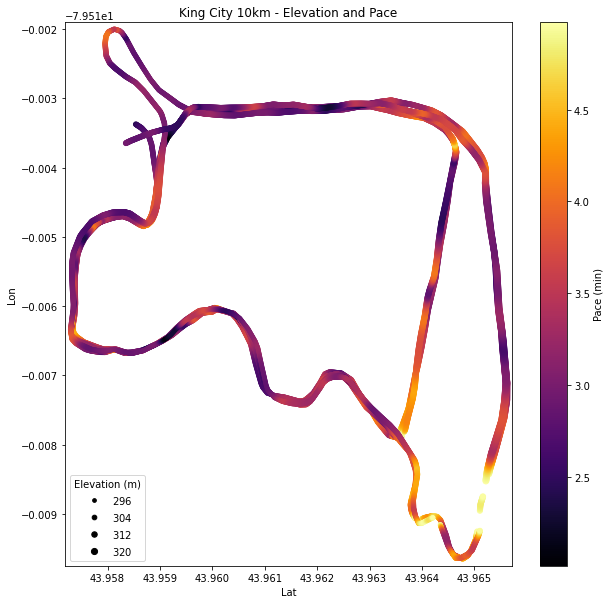

Course average grade adjusted pace - Strava, Minetti
1073.531822657948 -976.7061895754329
Western International 10km.gpx
Total Time :  33  min  53  sec 
Number of hairpins in course
4


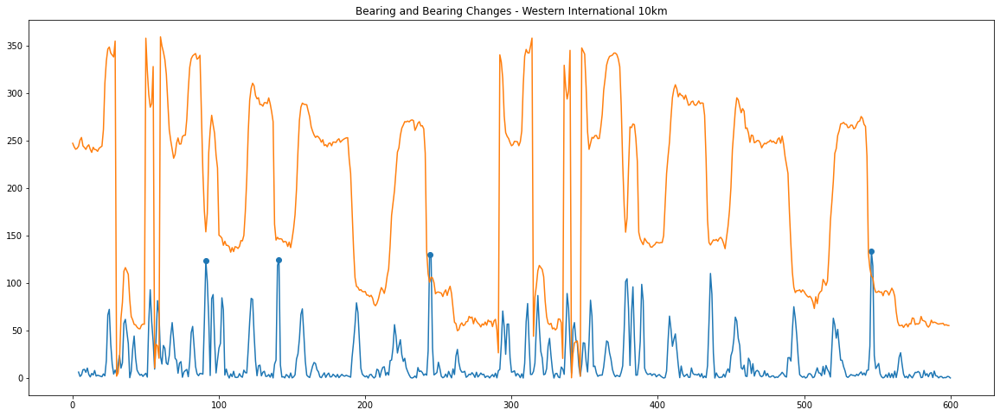

Standard Deviation
25.087924815827066
Total Degrees Turned
10432.960095903249
Race Distance/area of the course are 9968.833 m / 460036.2 m^2
10480
10419
10436


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


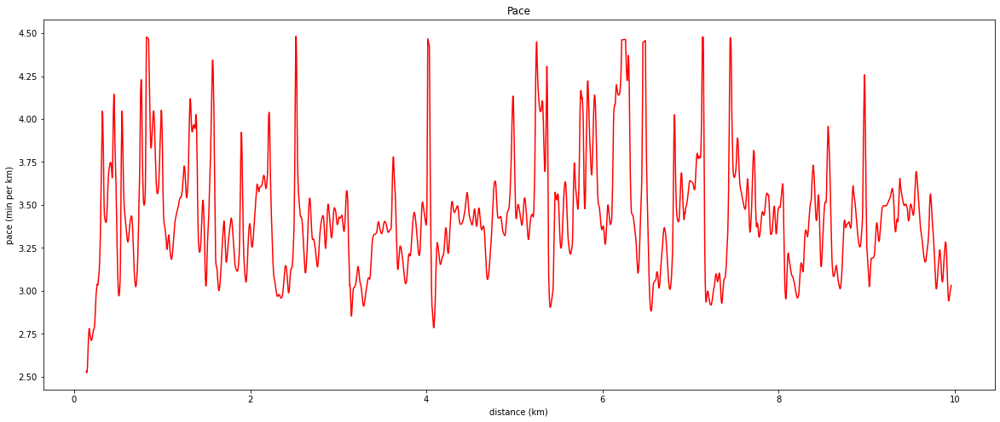

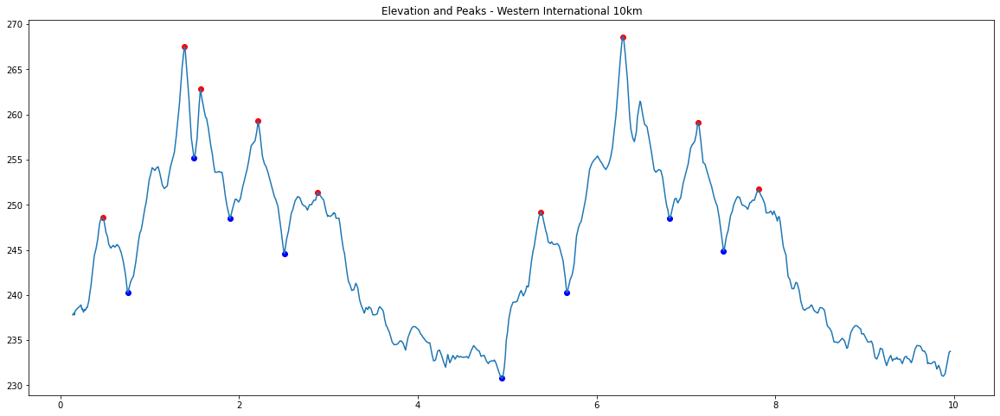

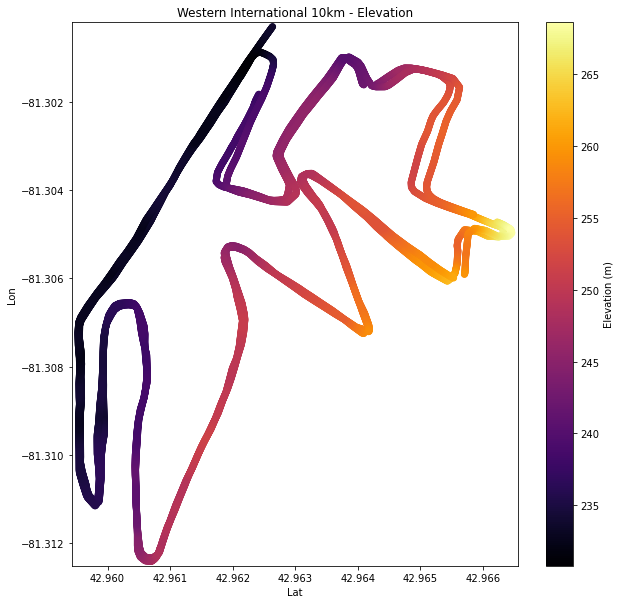

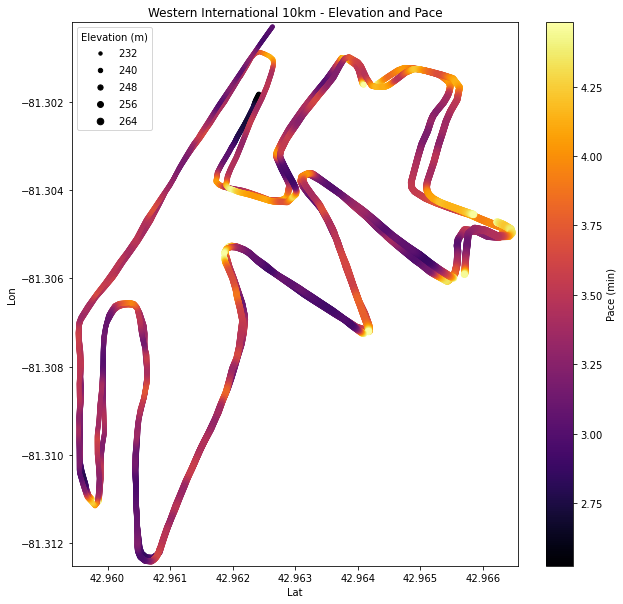

Course average grade adjusted pace - Strava, Minetti
-53.716156182741486 87.11416443117602
Louisville Classic 8km.gpx
Total Time :  26  min  10  sec 
Number of hairpins in course
0


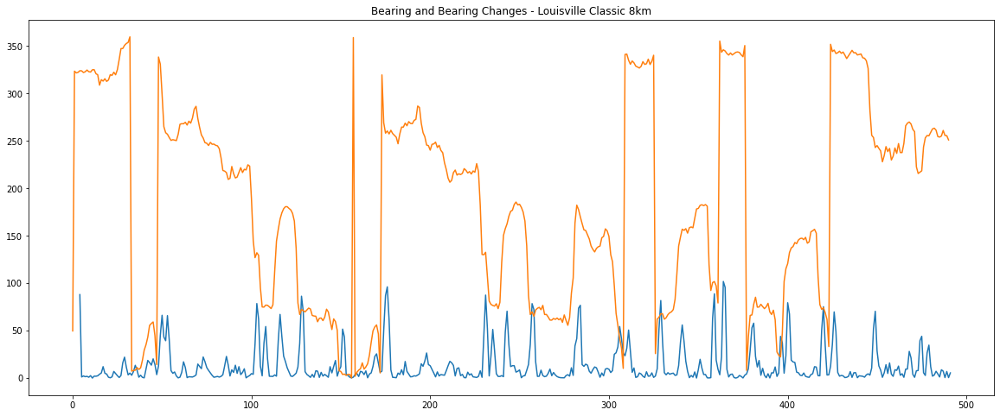

Standard Deviation
19.73802316471188
Total Degrees Turned
6781.40328805171
Race Distance/area of the course are 8540.026 m / 643863.7 m^2


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


8657
8609
8633


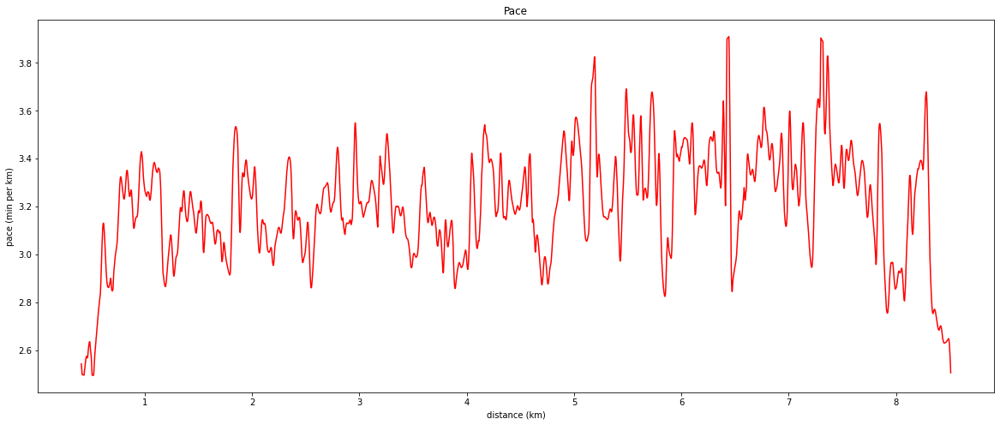

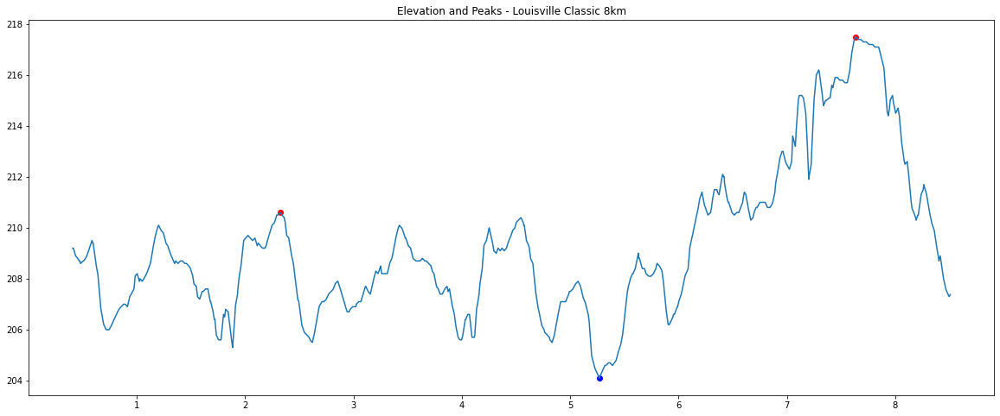

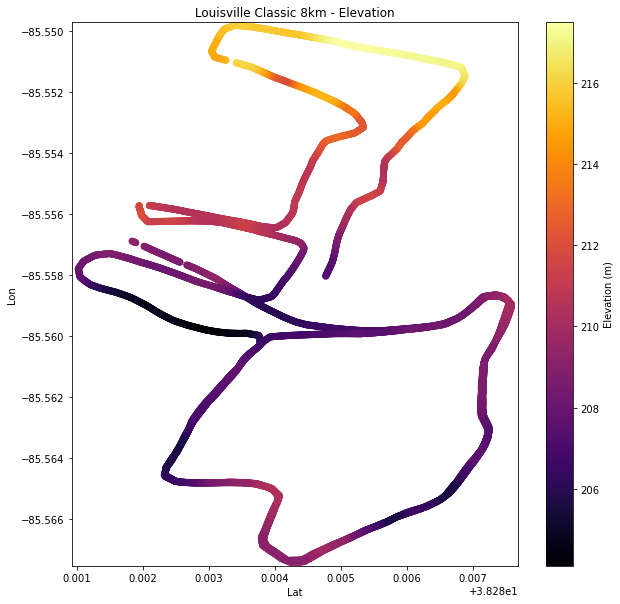

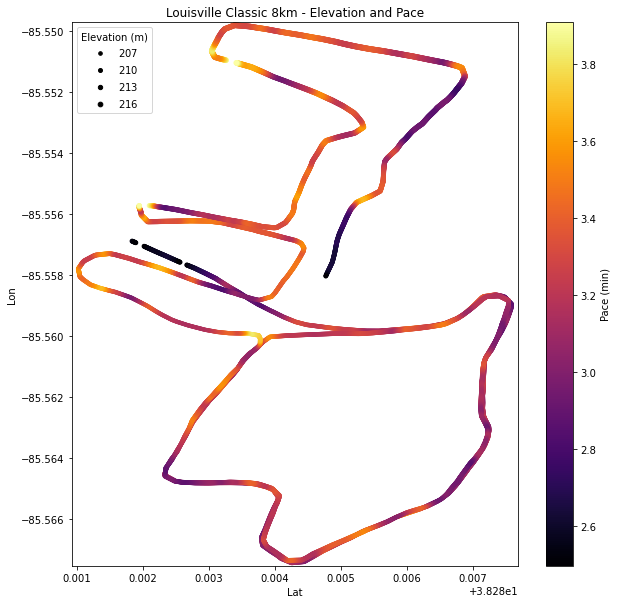

Course average grade adjusted pace - Strava, Minetti
1.0541978347138437 1.0210899591903835
Fort Henry 10km.gpx
Total Time :  35  min  33  sec 
Number of hairpins in course
4


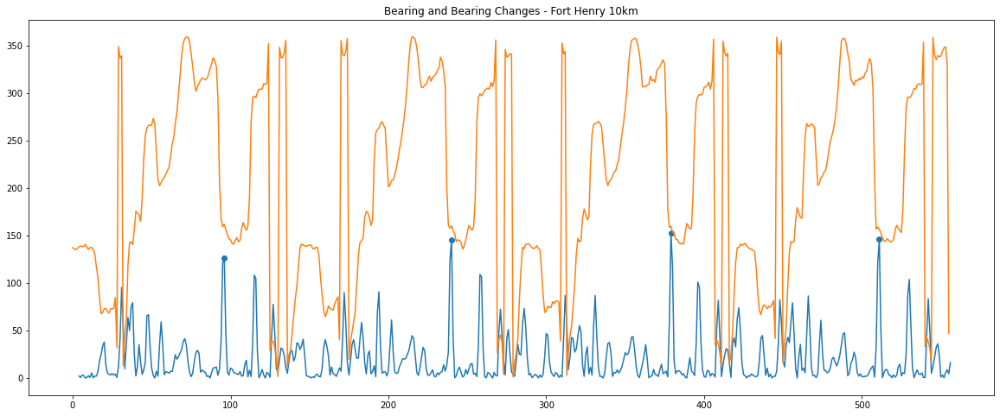

Standard Deviation
25.75971545742322
Total Degrees Turned
11634.60787445742
Race Distance/area of the course are 10110.727 m / -324374.4 m^2
10635
10517
10585


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


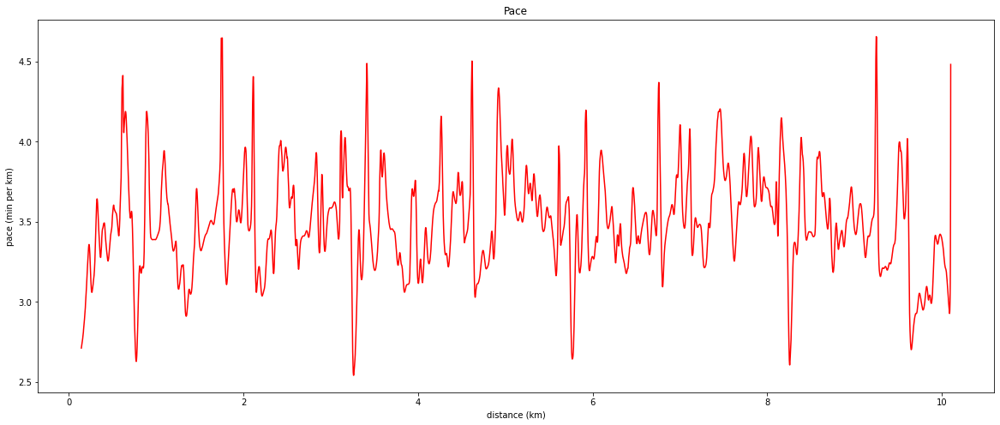

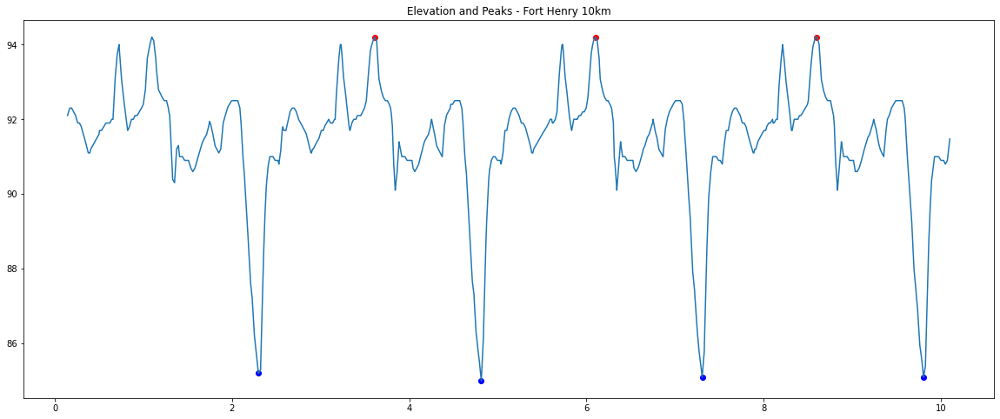

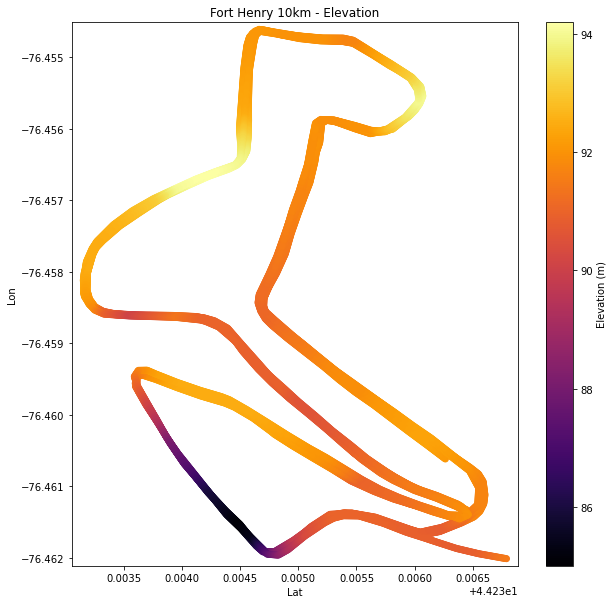

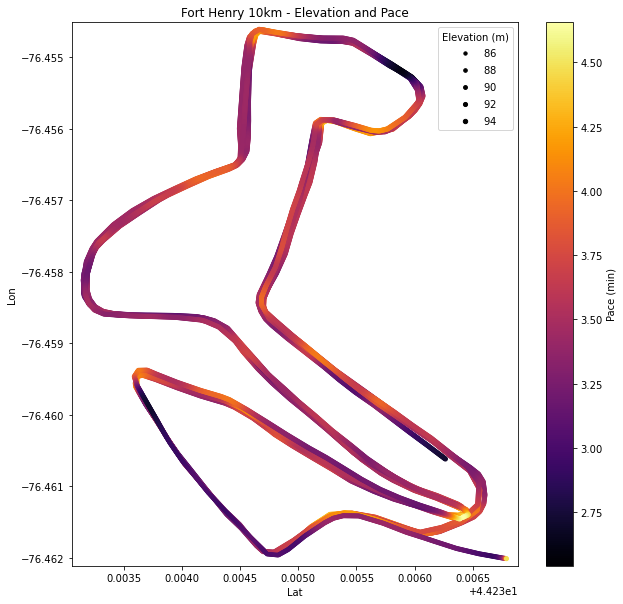

Course average grade adjusted pace - Strava, Minetti
1.0162910223789001 1.015433642770173
Point Pleasant Park.gpx
Total Time :  34  min  14  sec 
Number of hairpins in course
16


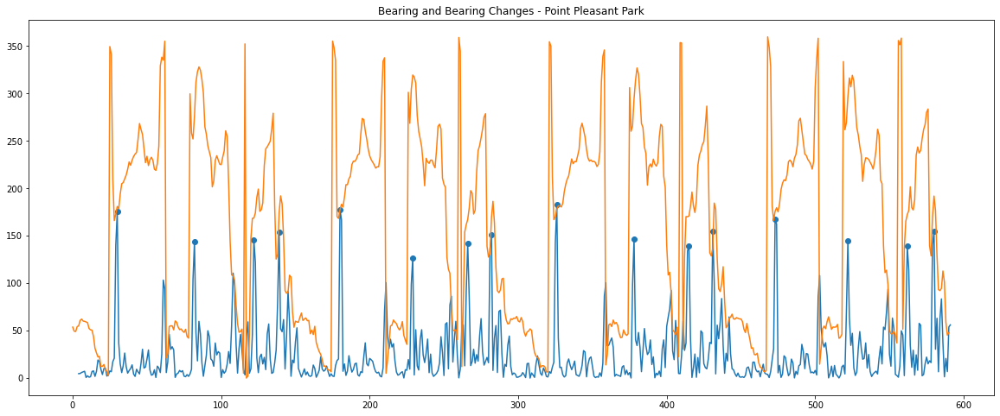

Standard Deviation
34.12429255306913
Total Degrees Turned
15666.400836142191
Race Distance/area of the course are 9724.775 m / 228902.2 m^2
10298
10183
10249


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


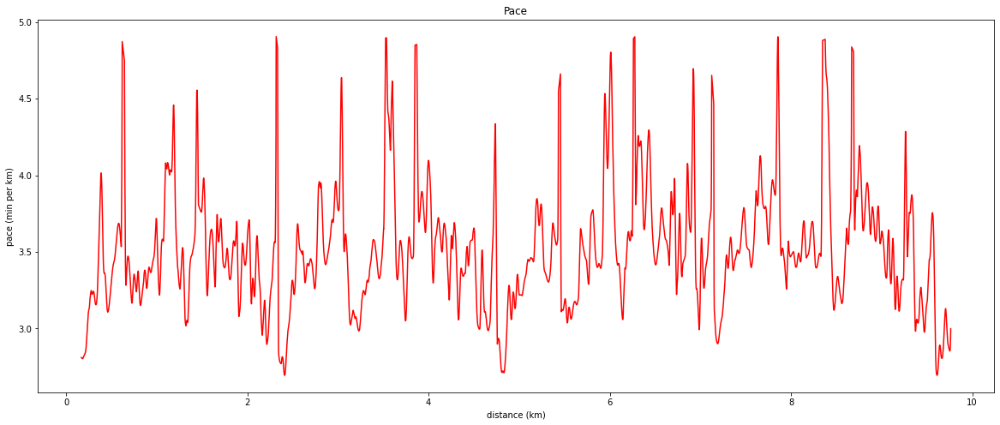

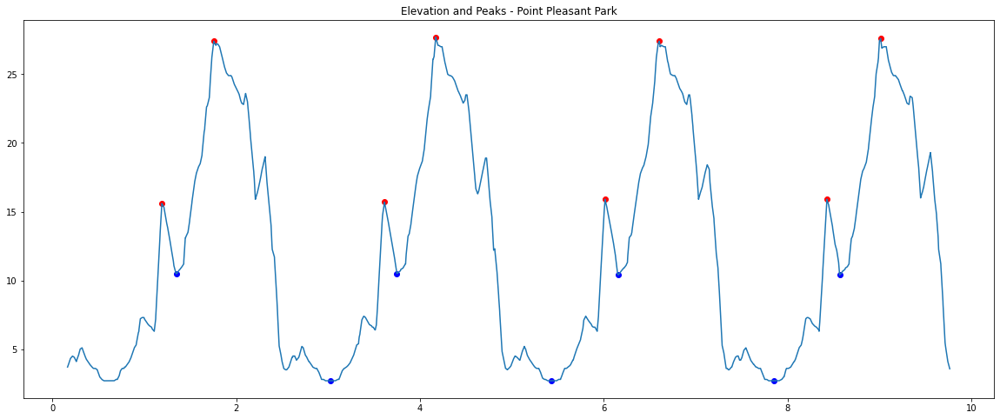

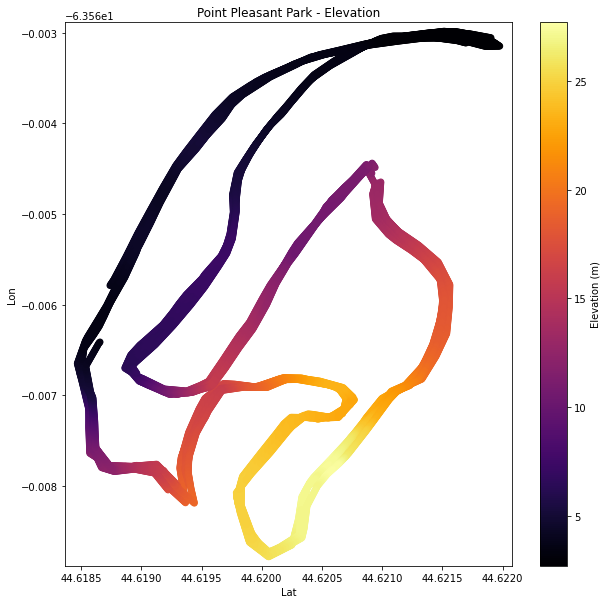

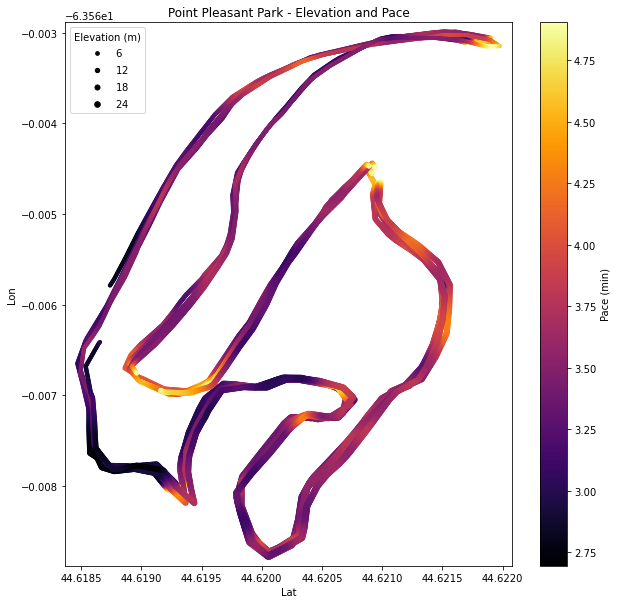

Course average grade adjusted pace - Strava, Minetti
42.698569839484946 -30.216388889324307
Malden Park 10km.gpx
Total Time :  32  min  43  sec 
Number of hairpins in course
5


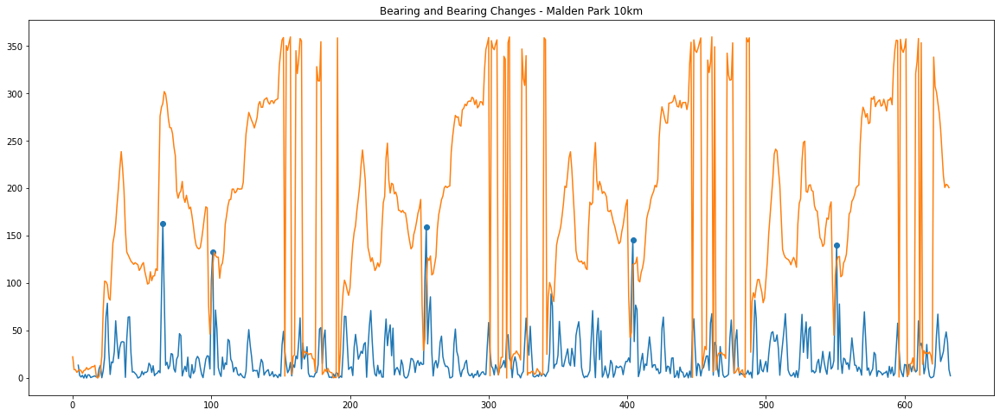

Standard Deviation
22.86348682080748
Total Degrees Turned
12617.610142733713
Race Distance/area of the course are 9634.530 m / -651923.8 m^2
10178
10110
10152


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


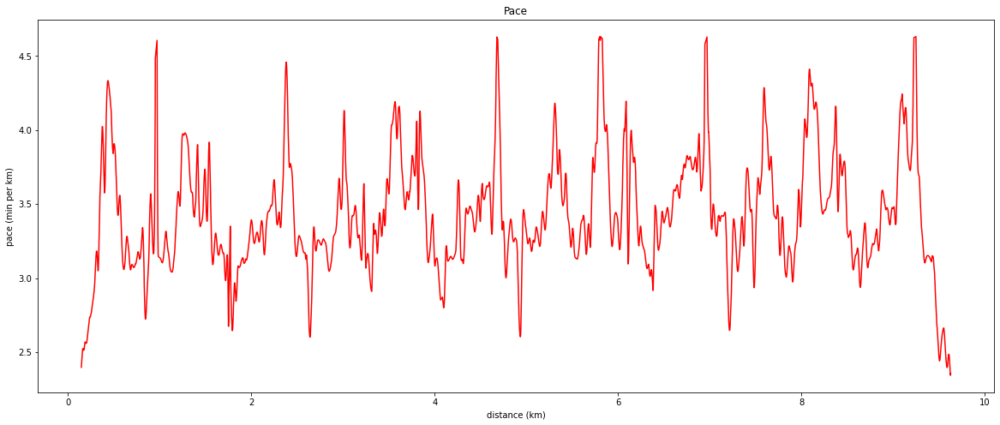

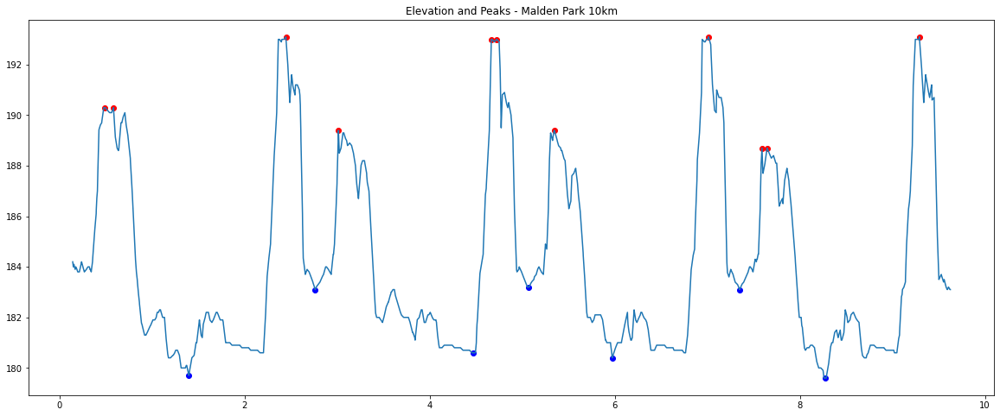

one hill error
one hill error
one hill error


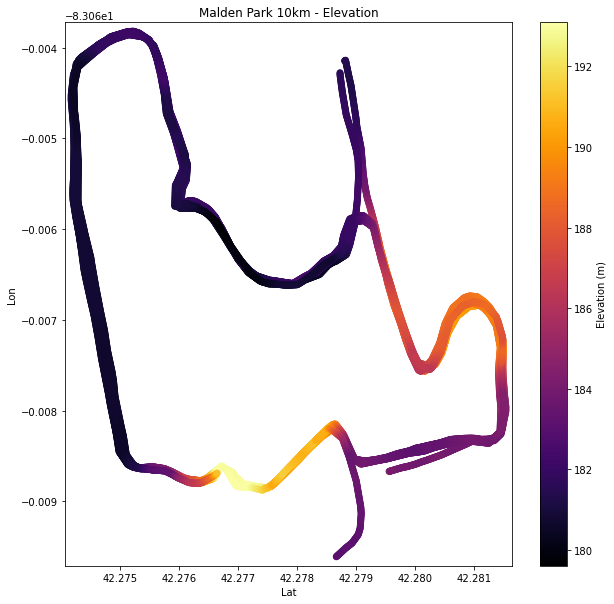

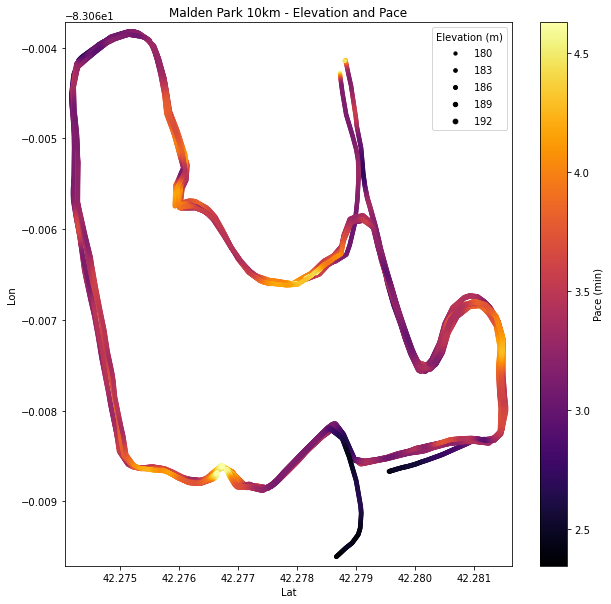

Course average grade adjusted pace - Strava, Minetti
-5.2128722300776715 13.498178911118142
Moncton Classic 8km.gpx
Total Time :  29  min  58  sec 
Number of hairpins in course
4


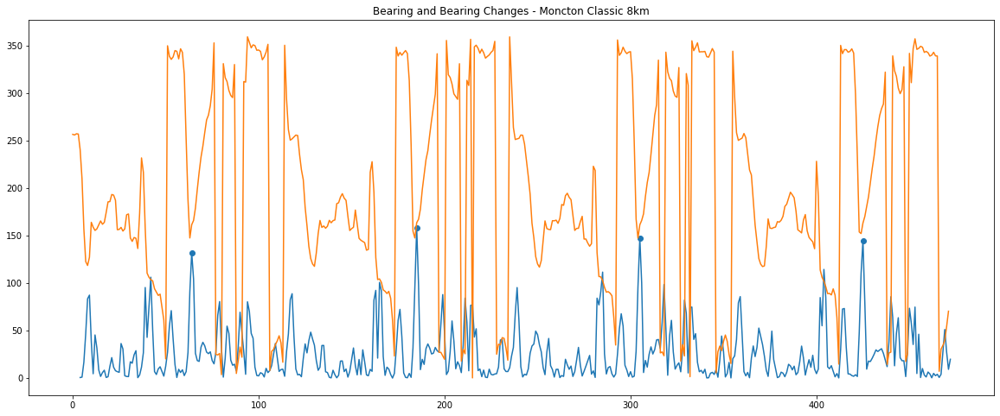

Standard Deviation
28.408746846064318
Total Degrees Turned
12423.227402196197
Race Distance/area of the course are 8300.696 m / 112459.9 m^2
8747
8640
8703


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


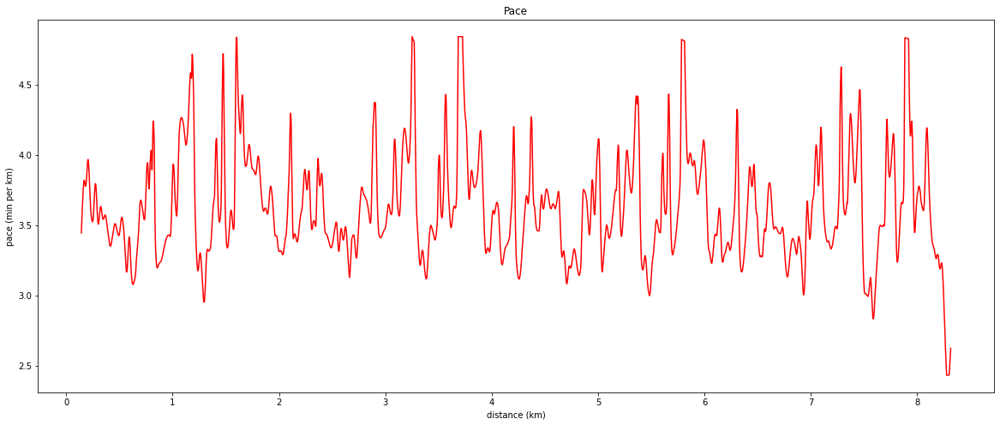

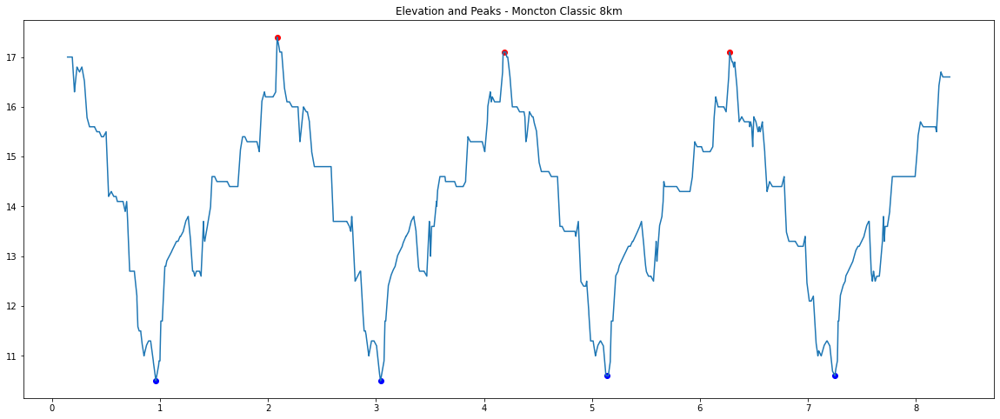

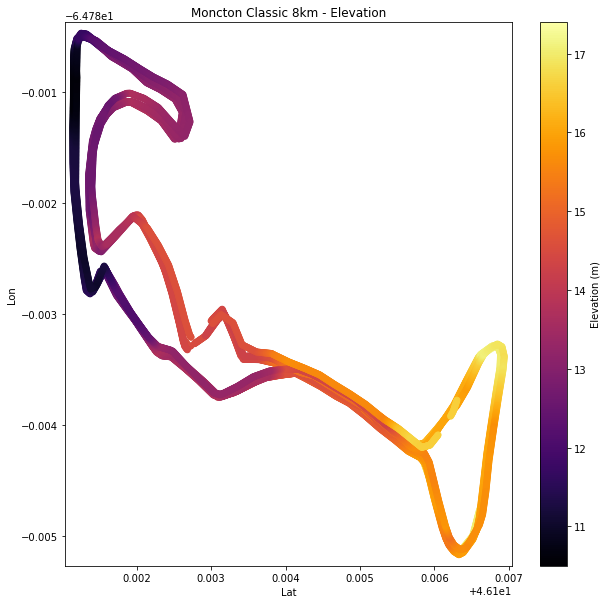

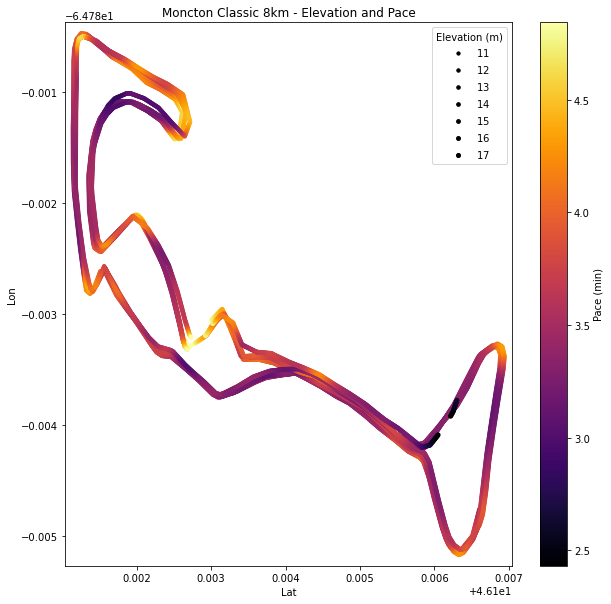

Course average grade adjusted pace - Strava, Minetti
-14505.365489434045 17278.6729521446
Guelph Arboretum 7_5km.gpx
Total Time :  24  min  13  sec 
Number of hairpins in course
0


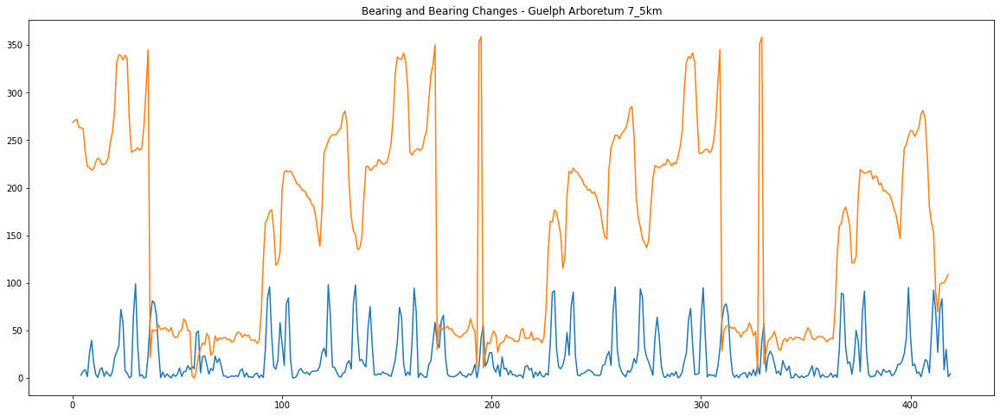

Standard Deviation
25.00121832081395
Total Degrees Turned
8124.119436725877
Race Distance/area of the course are 7500.442 m / -523345.2 m^2
7902
7788
7857


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


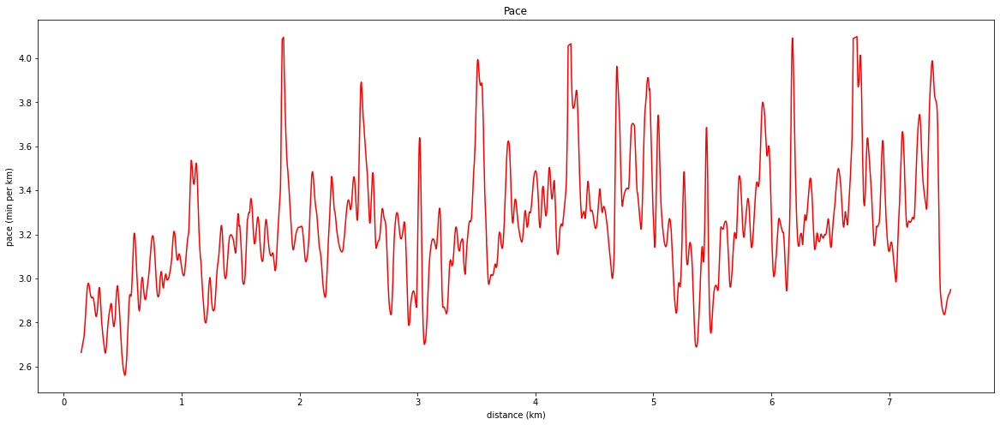

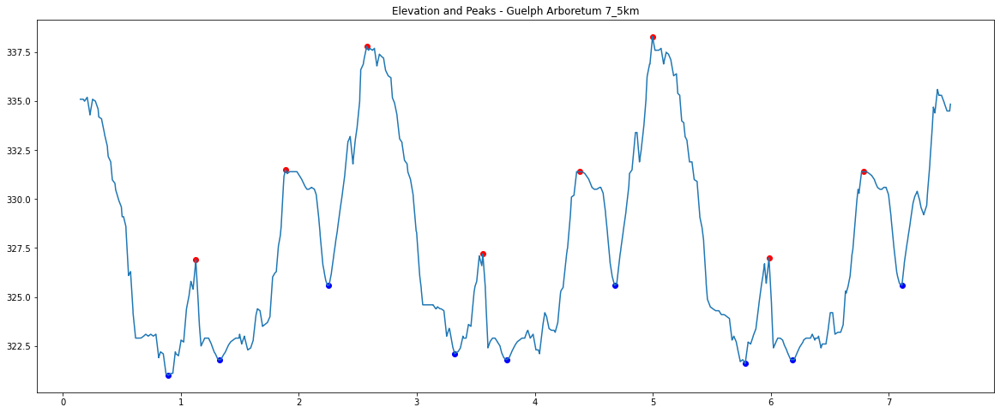

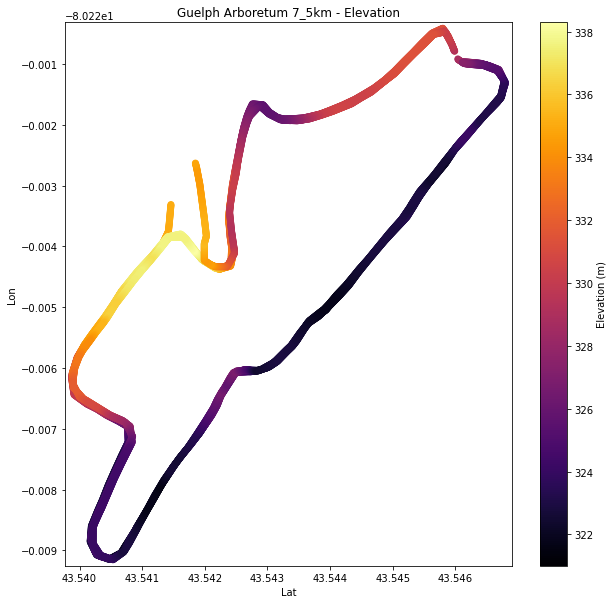

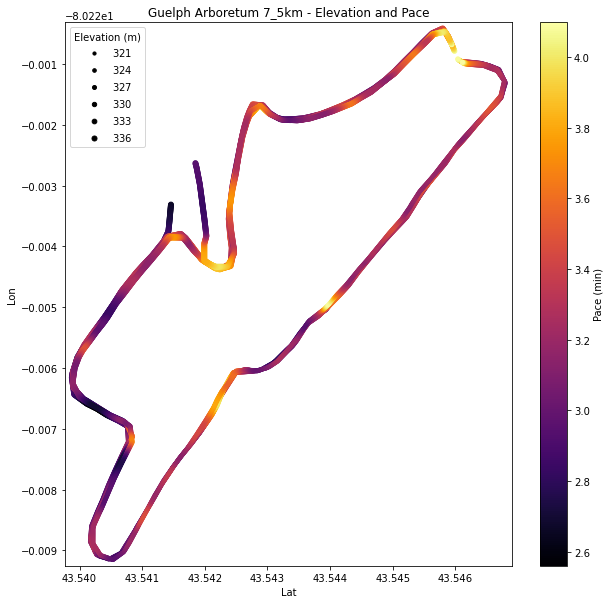

Course average grade adjusted pace - Strava, Minetti
109416.27037579911 -109539.81297446451
Fanshawe Invitational 8km.gpx
Total Time :  30  min  6  sec 
Number of hairpins in course
4


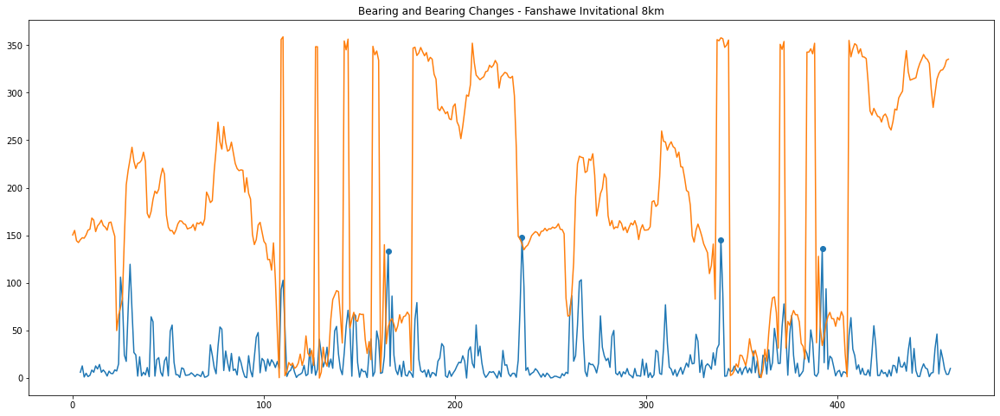

Standard Deviation
24.18020649841233
Total Degrees Turned
8634.827413088222
Race Distance/area of the course are 8126.289 m / 609178.0 m^2
8595
8503
8549


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


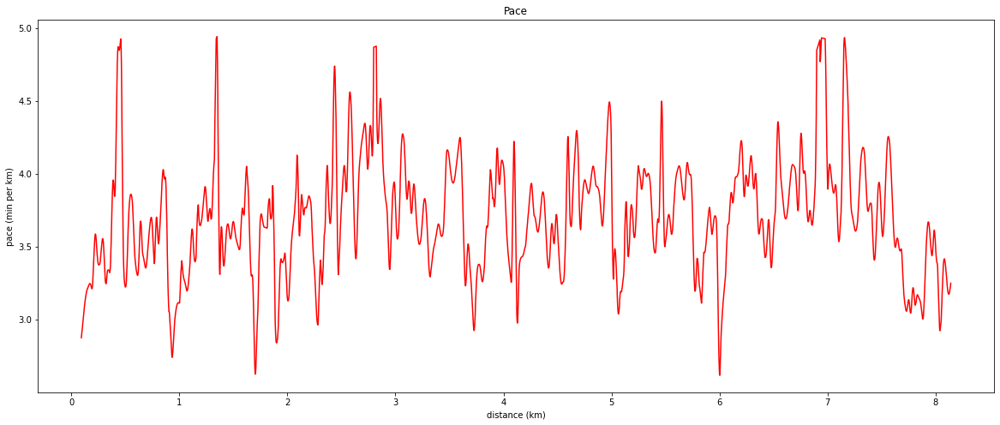

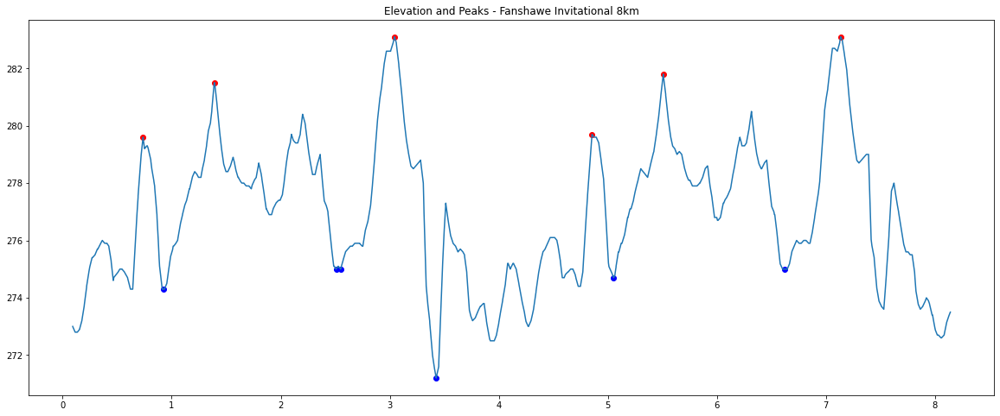

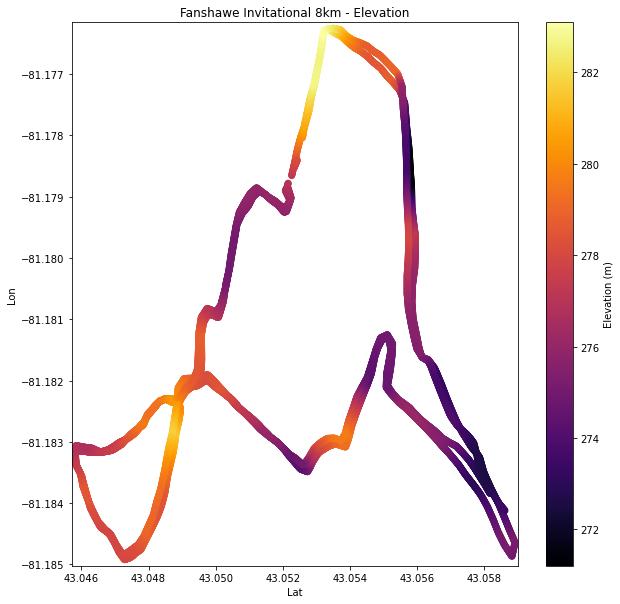

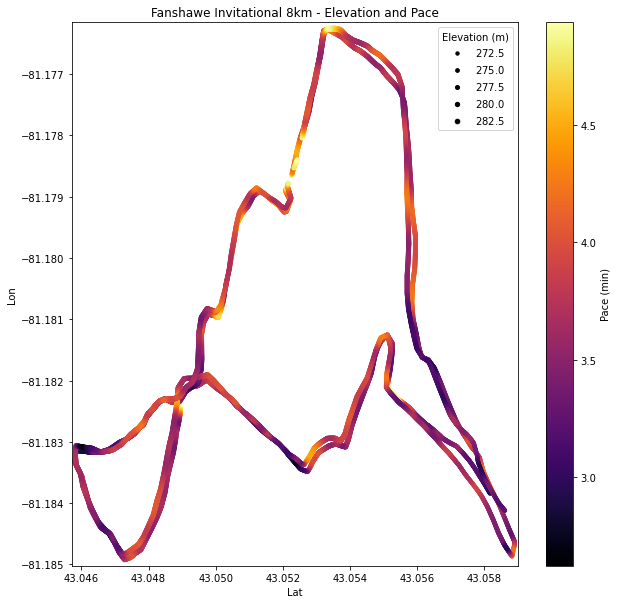

Course average grade adjusted pace - Strava, Minetti
29.02235597489107 -20.49413774812022
StFX Invitational 8km.gpx
Total Time :  29  min  30  sec 
Number of hairpins in course
71


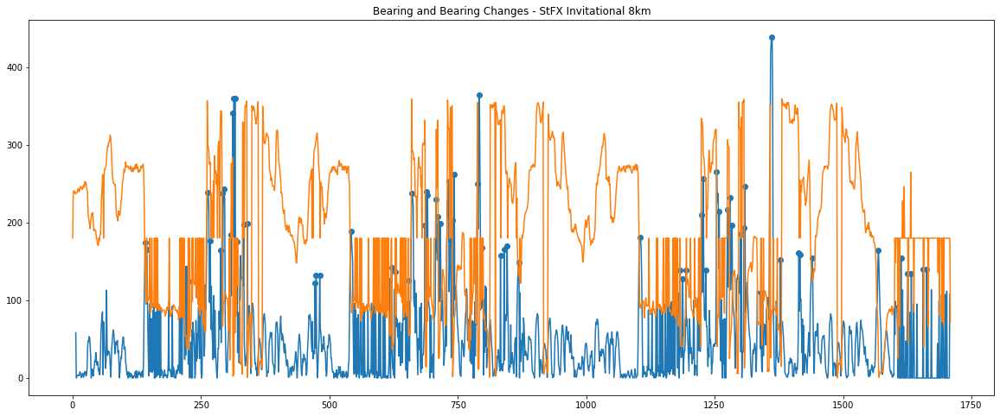

Standard Deviation
58.441979895420985
Total Degrees Turned
86506.59678709316
Race Distance/area of the course are 7862.697 m / 209436.0 m^2


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


9314
9268
9285


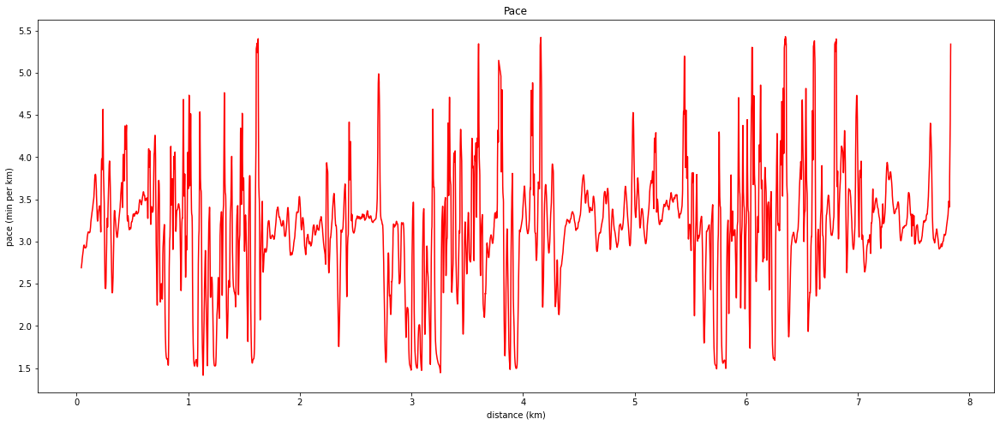

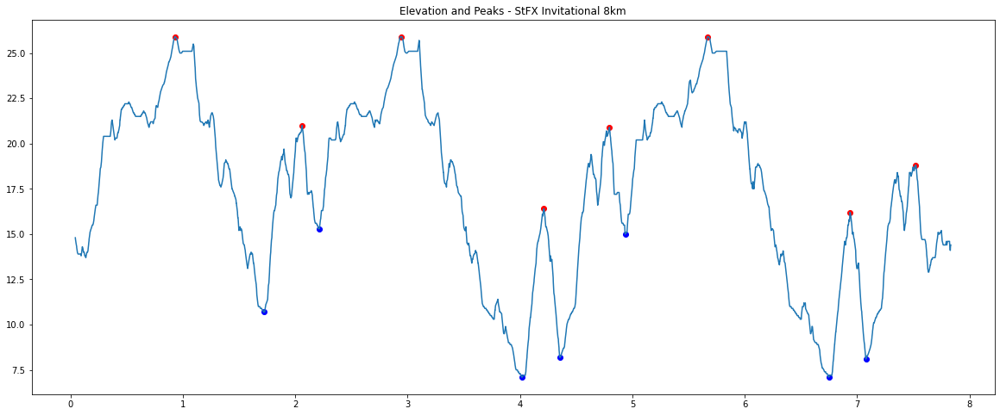

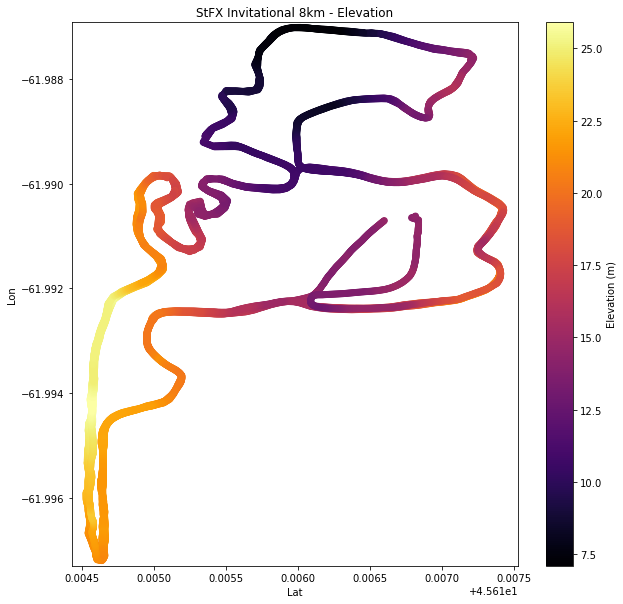

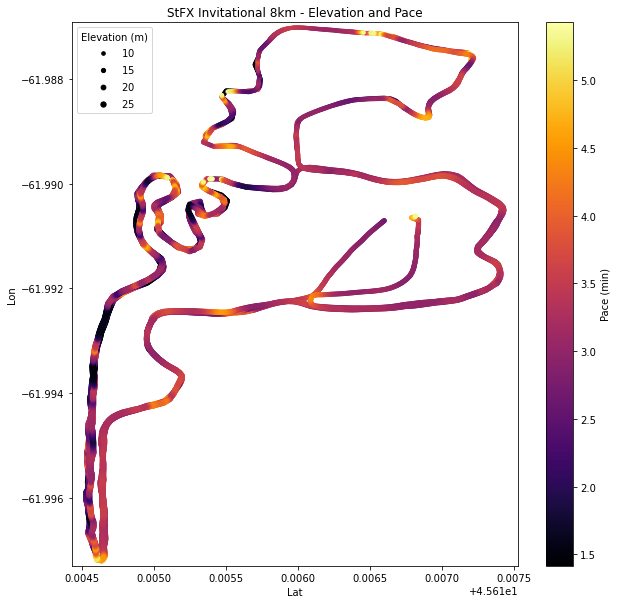

Course average grade adjusted pace - Strava, Minetti
16273.805299487247 -15843.841781705692
Odell Park 7_5km.gpx
Total Time :  29  min  10  sec 
Number of hairpins in course
3


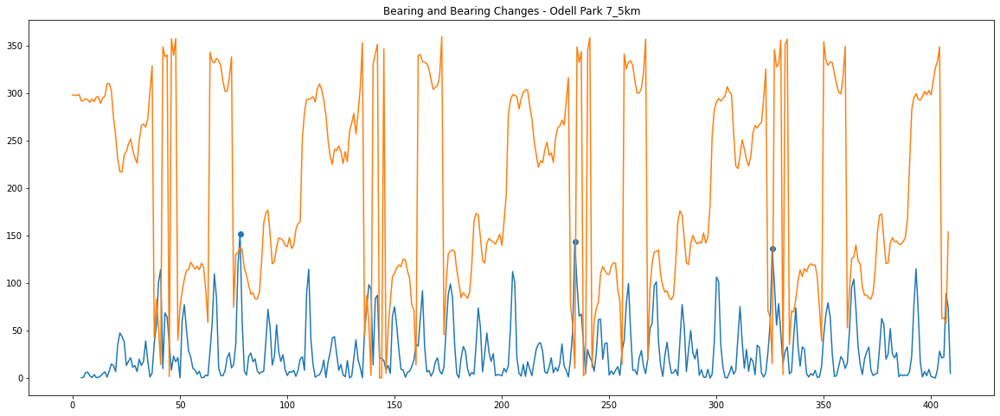

Standard Deviation
29.603464608845087
Total Degrees Turned
11187.967765392998
Race Distance/area of the course are 7984.956 m / -282688.3 m^2
7981
7870
7934


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


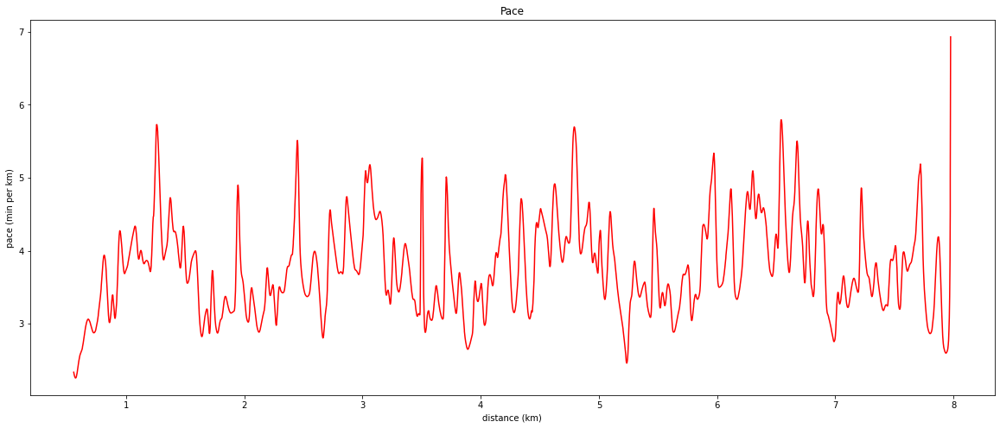

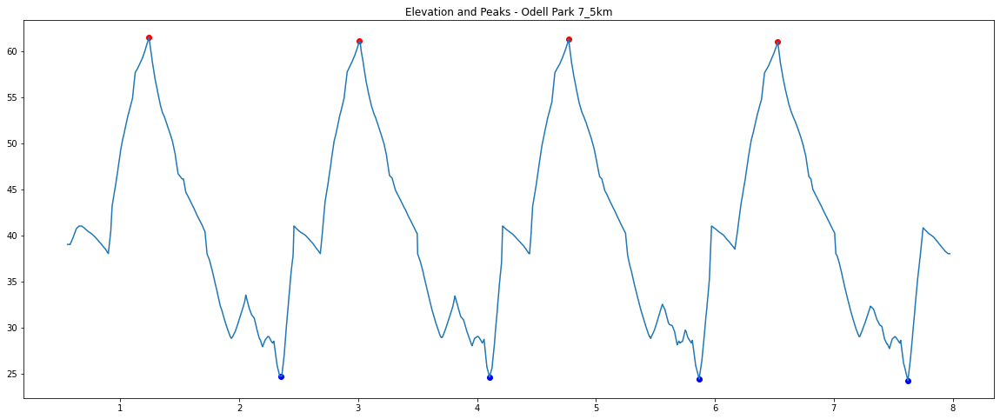

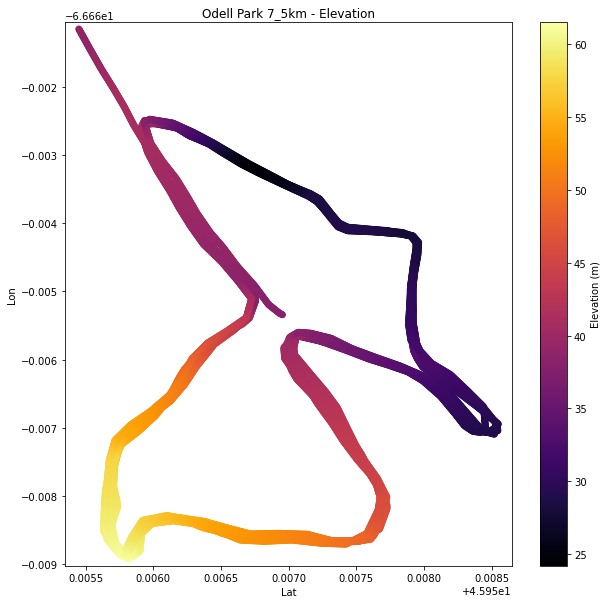

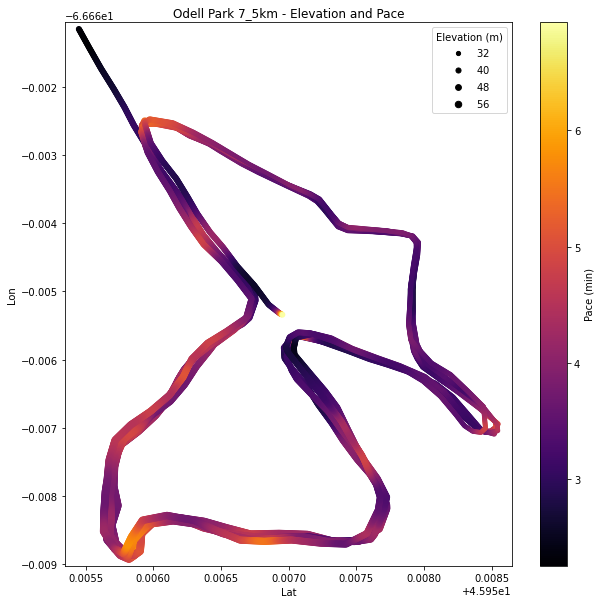

Course average grade adjusted pace - Strava, Minetti
27.358405585555083 -8.518239767378821
Guelph Arboretum 10km.gpx
Total Time :  33  min  27  sec 
Number of hairpins in course
9


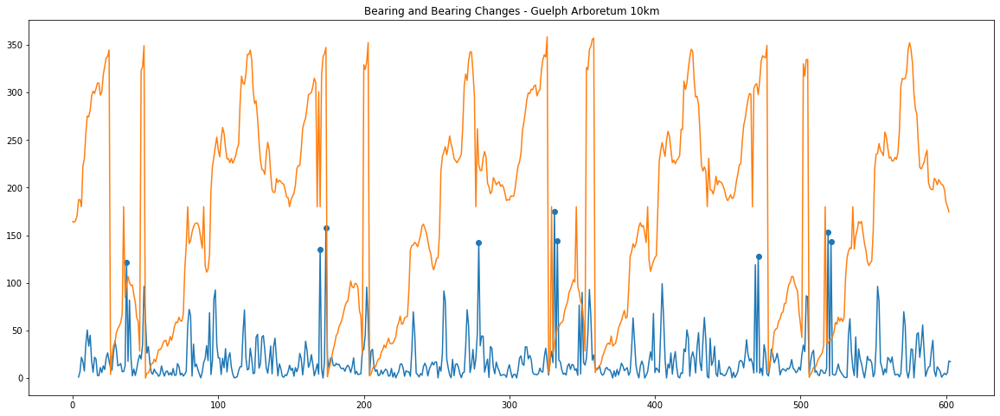

Standard Deviation
24.35463956720964
Total Degrees Turned
11532.607017120092
Race Distance/area of the course are 10088.536 m / -665319.7 m^2
10662
10554
10615


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


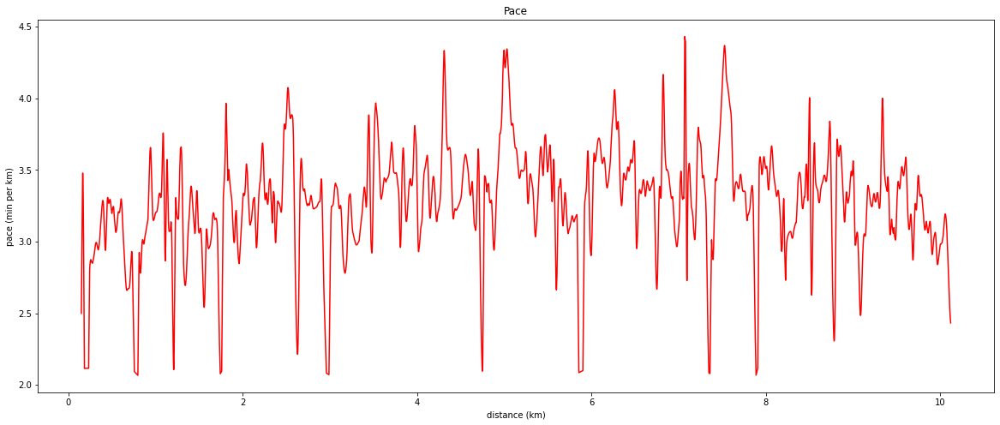

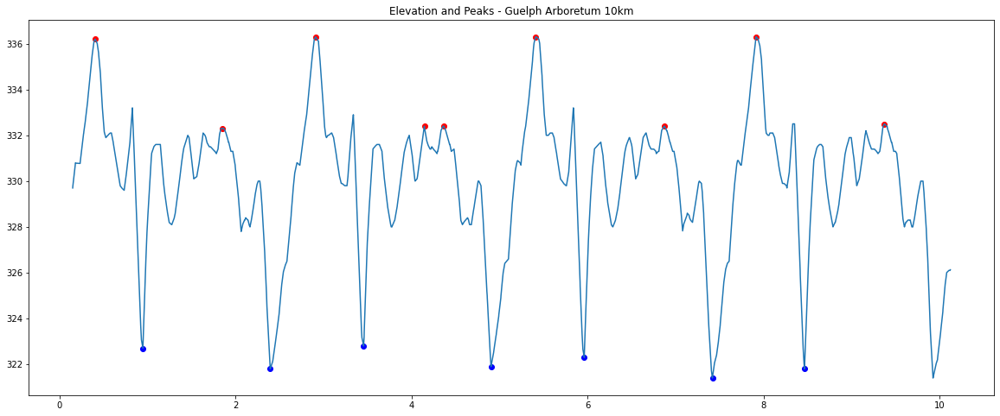

one hill error


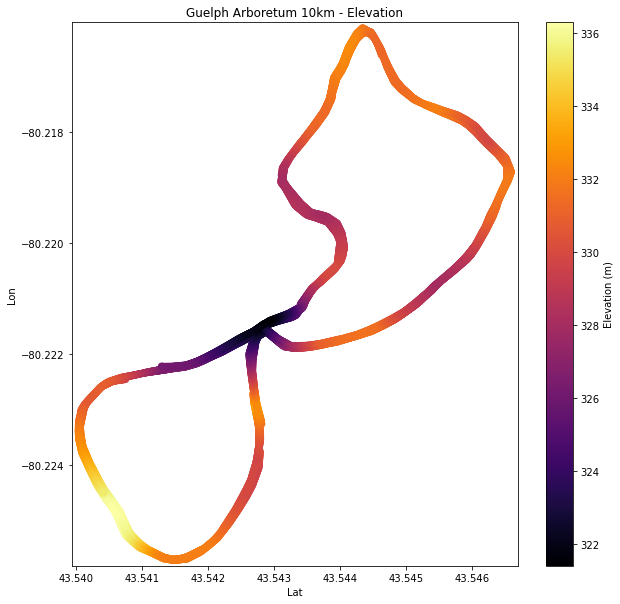

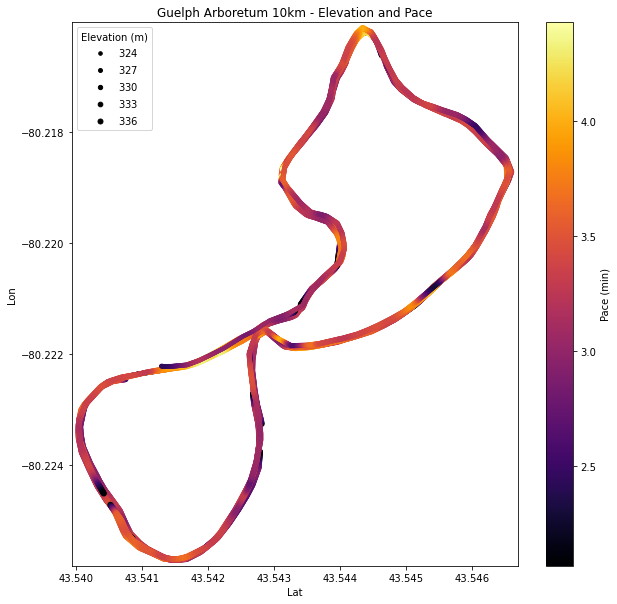

Course average grade adjusted pace - Strava, Minetti
-0.2714375527275525 4.930563742834804
Loyola Lakefront 8km.gpx
Total Time :  26  min  20  sec 
Number of hairpins in course
2


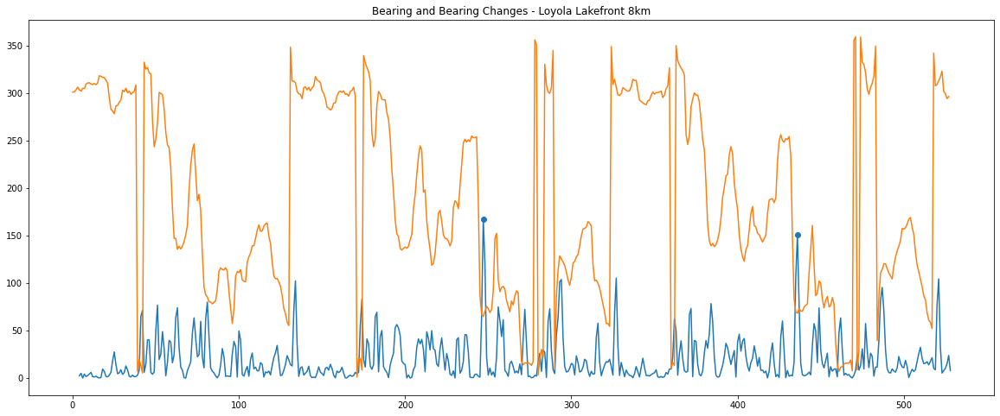

Standard Deviation
23.426609331689214
Total Degrees Turned
10541.426992275536
Race Distance/area of the course are 8107.435 m / 383615.6 m^2
8594
8532
8547


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


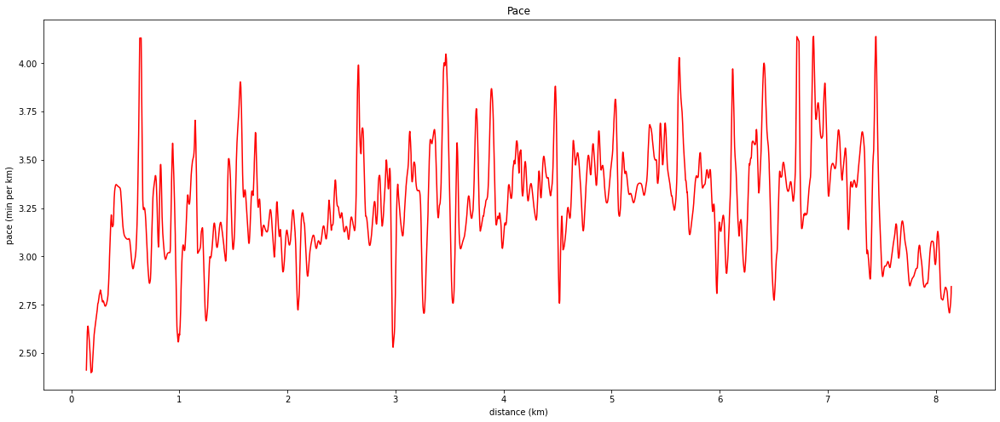

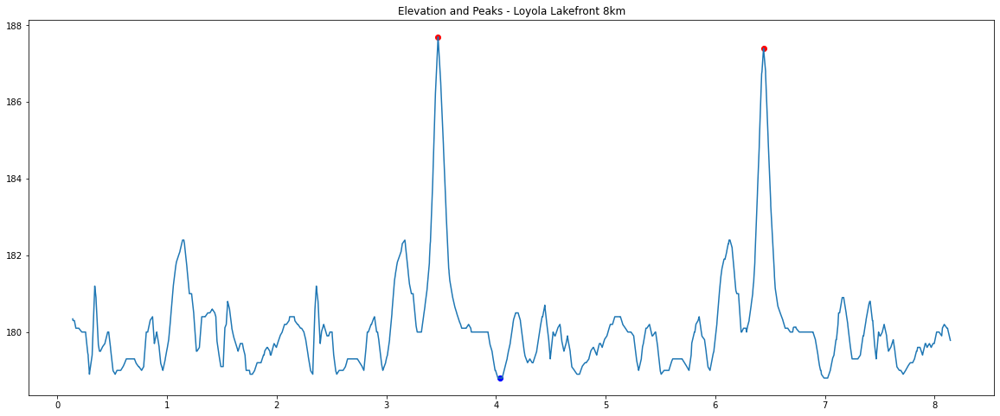

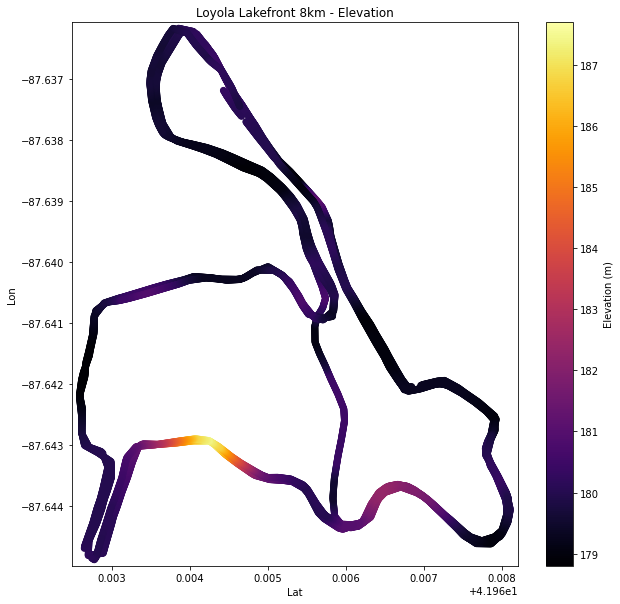

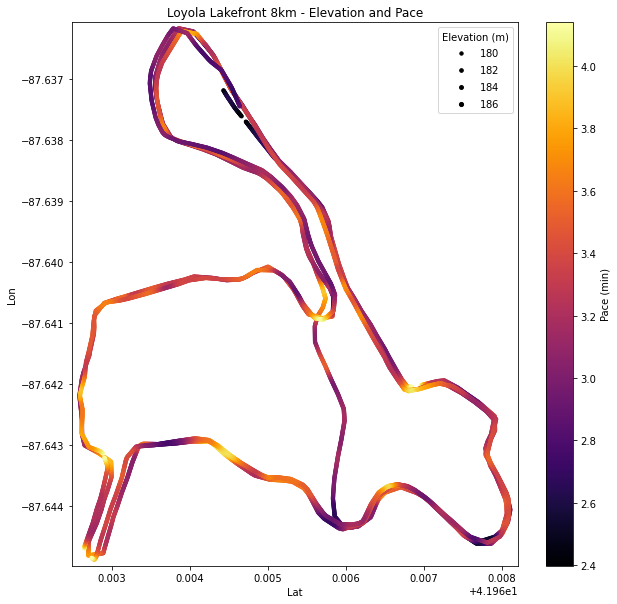

Course average grade adjusted pace - Strava, Minetti
1.3010419383442646 1.9027044826825033
Victoria Park 6km.gpx
Total Time :  21  min  13  sec 
Number of hairpins in course
3


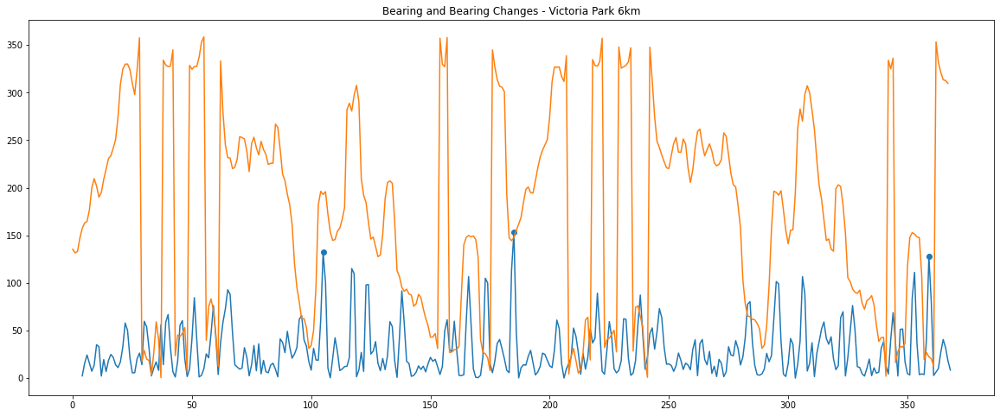

Standard Deviation
27.447763142557925
Total Degrees Turned
10800.627070801795
Race Distance/area of the course are 6025.610 m / 227856.4 m^2
6382
6281
6335


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


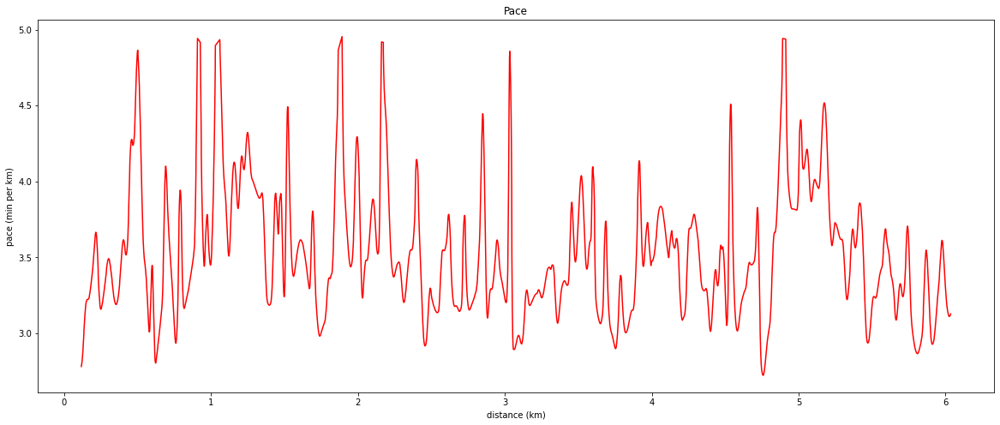

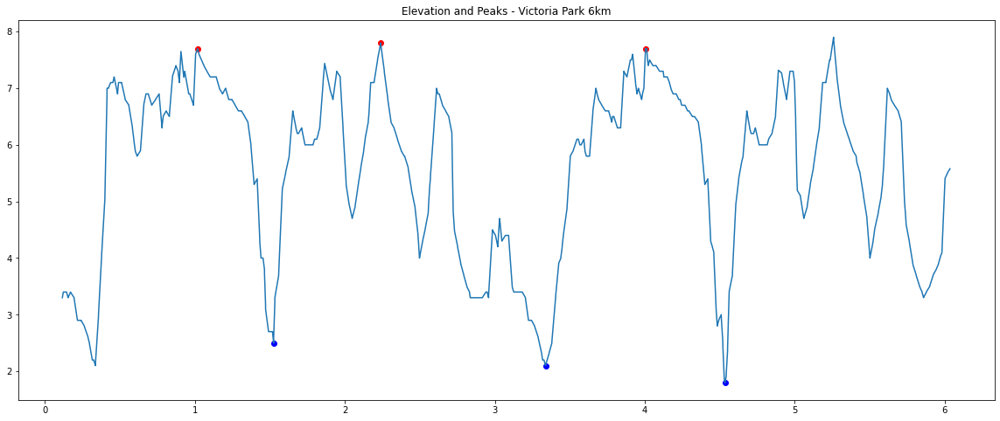

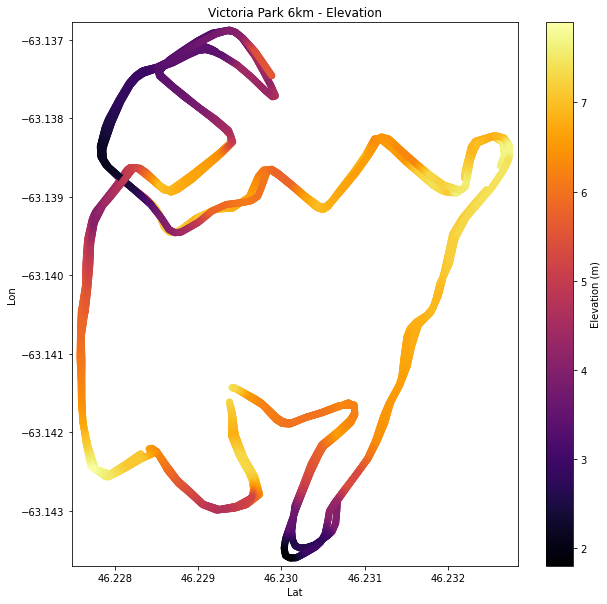

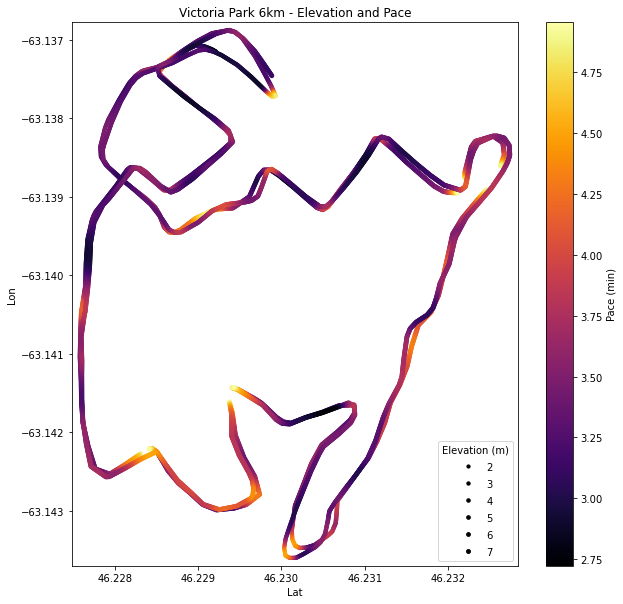

Course average grade adjusted pace - Strava, Minetti
1.0616424182442608 1.1285129825123605
Abbotsford 10km.gpx
Total Time :  29  min  19  sec 
Number of hairpins in course
1


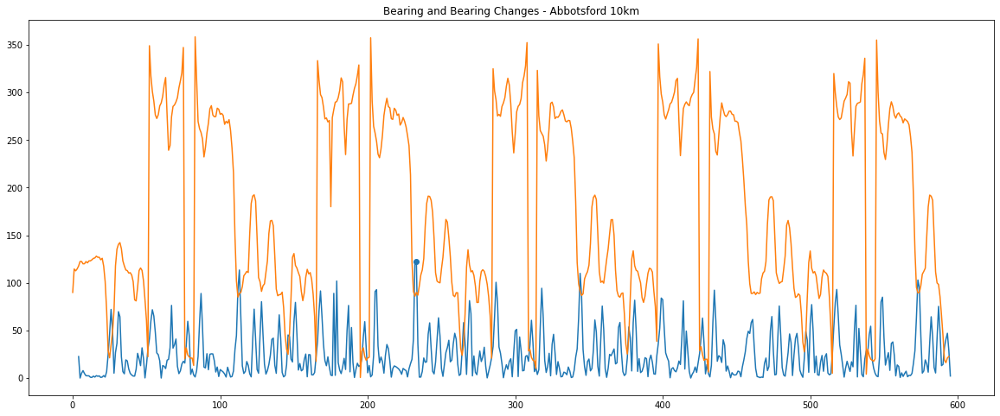

Standard Deviation
24.239589515008372
Total Degrees Turned
14742.197129092754
Race Distance/area of the course are 10007.719 m / 344111.2 m^2
10492
10416
10468


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


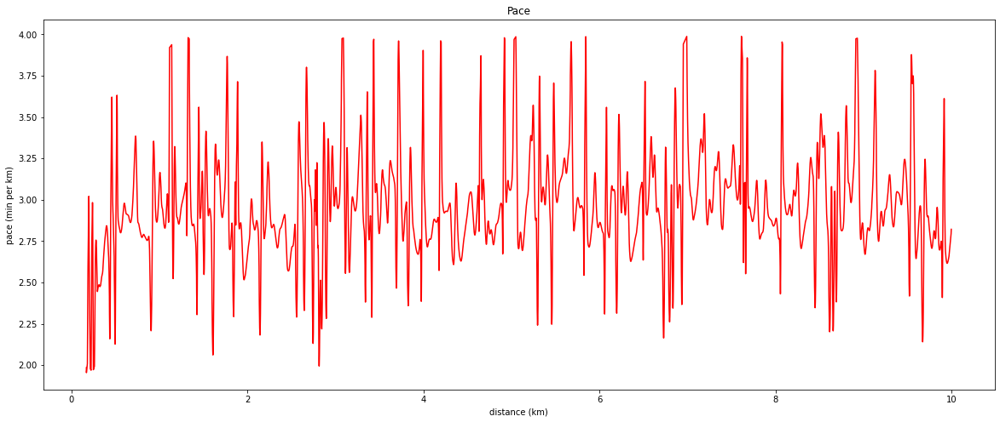

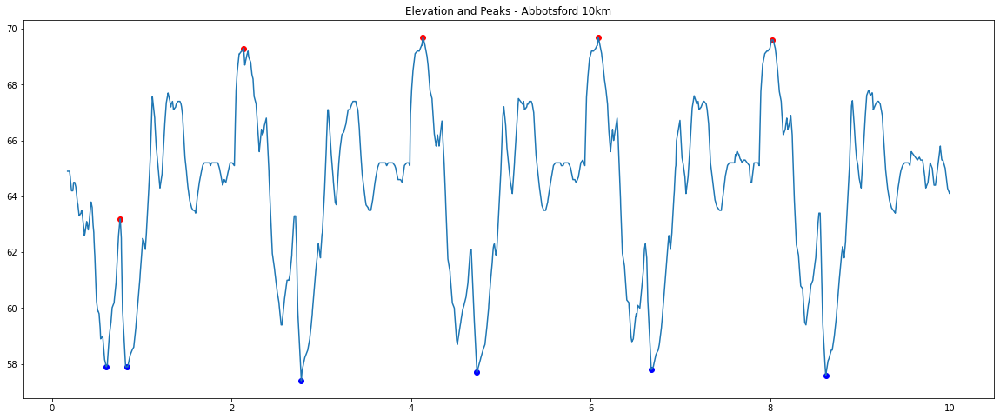

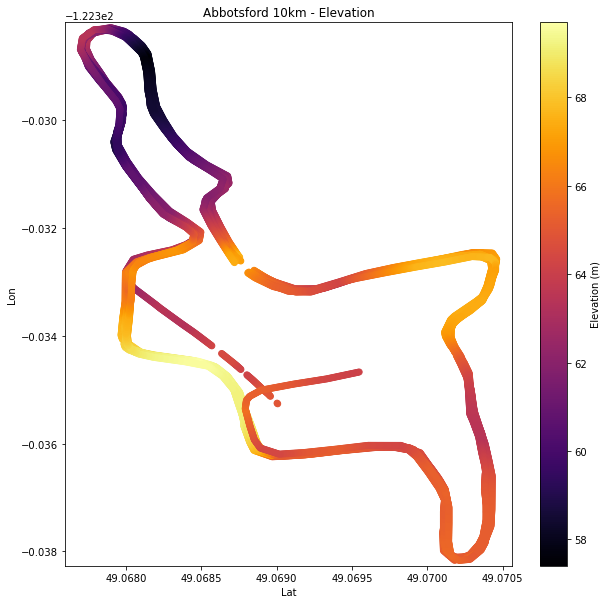

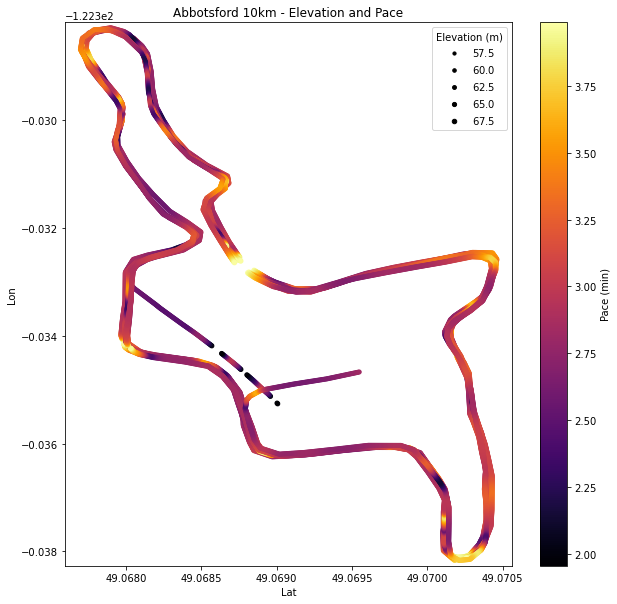

Course average grade adjusted pace - Strava, Minetti
-30564.320791233717 35928.84014084823
Terre Haute 10km.gpx
Total Time :  0  min  0  sec 
Number of hairpins in course
0


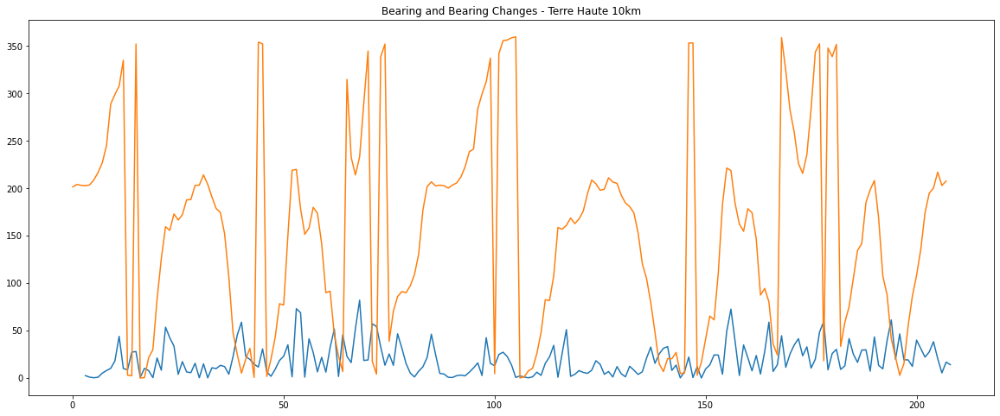

Standard Deviation
17.121750880246488
Total Degrees Turned
4031.854407678253
Race Distance/area of the course are 10307.795 m / -476844.6 m^2
no time


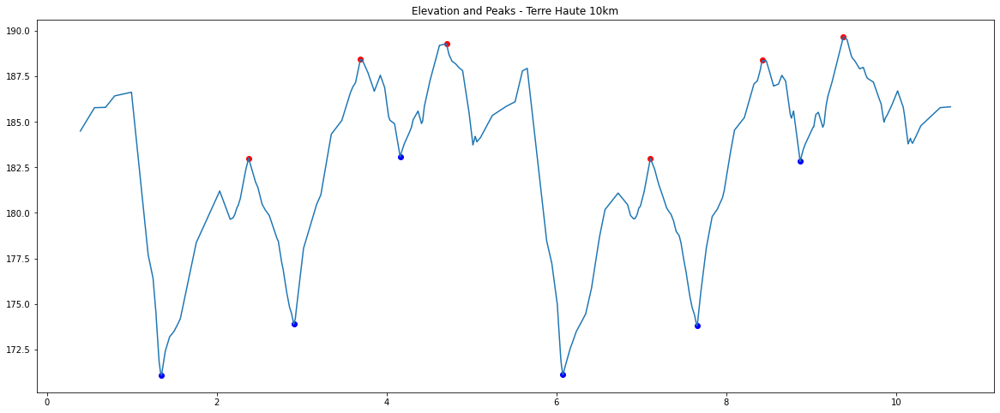

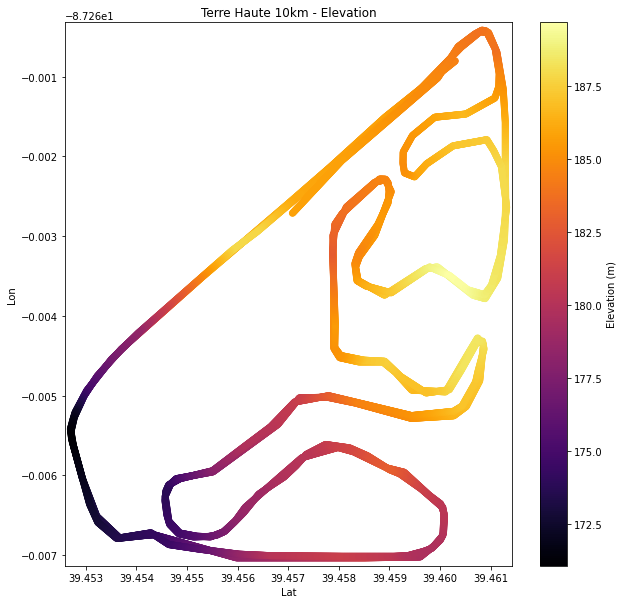

no time
Course average grade adjusted pace - Strava, Minetti
1.0261980674271456 1.0469518719323734
Western International 8km.gpx
Total Time :  26  min  44  sec 
Number of hairpins in course
6


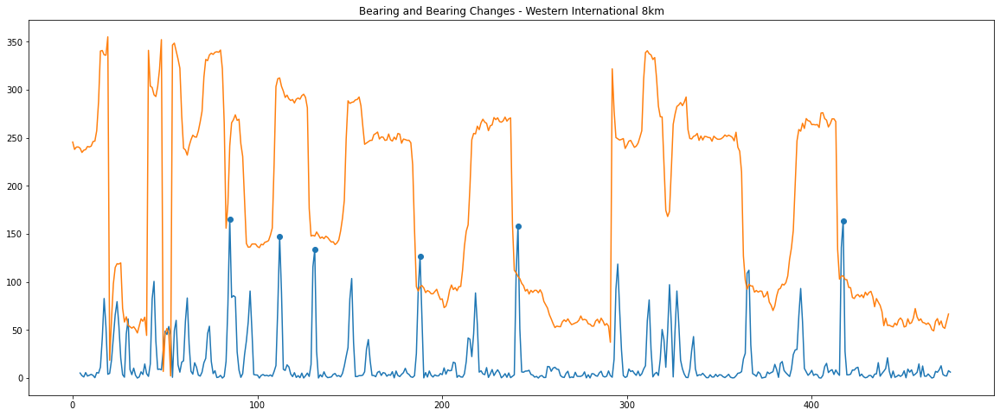

Standard Deviation
28.512731679469507
Total Degrees Turned
7912.138150858675
Race Distance/area of the course are 8000.927 m / 360970.0 m^2


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


8383
8296
8360


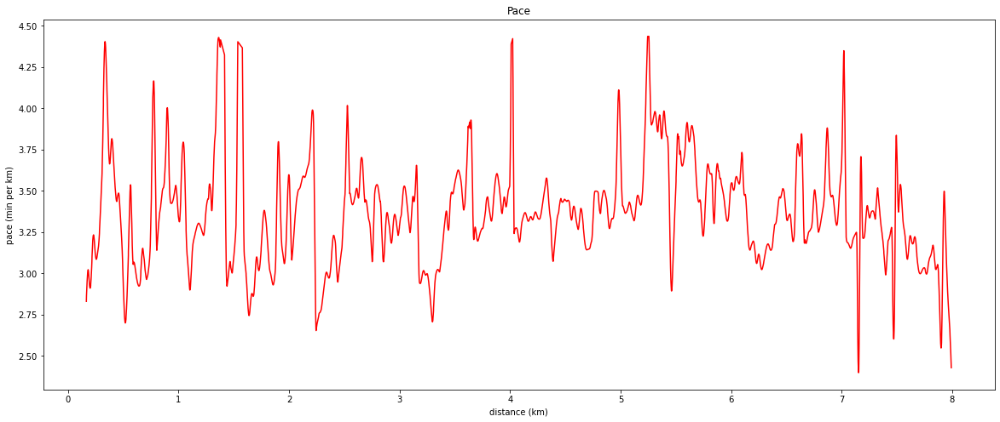

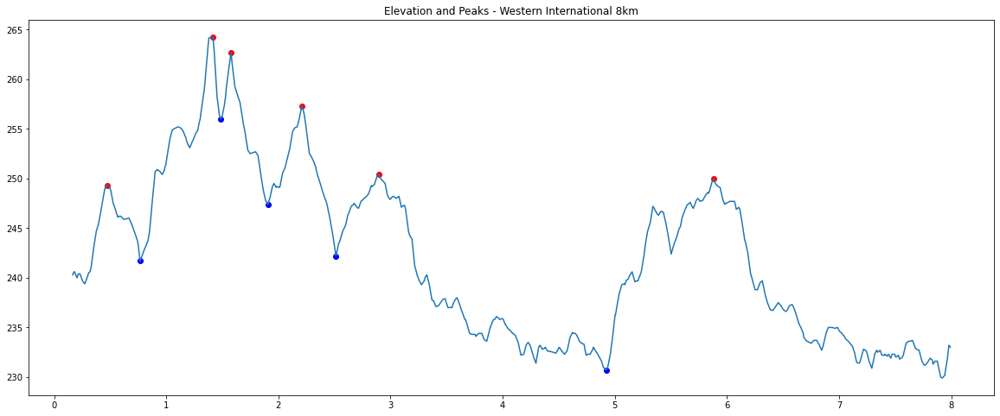

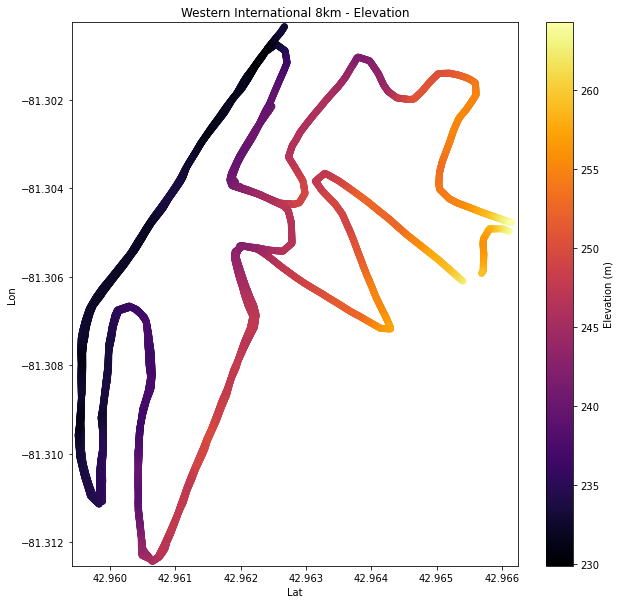

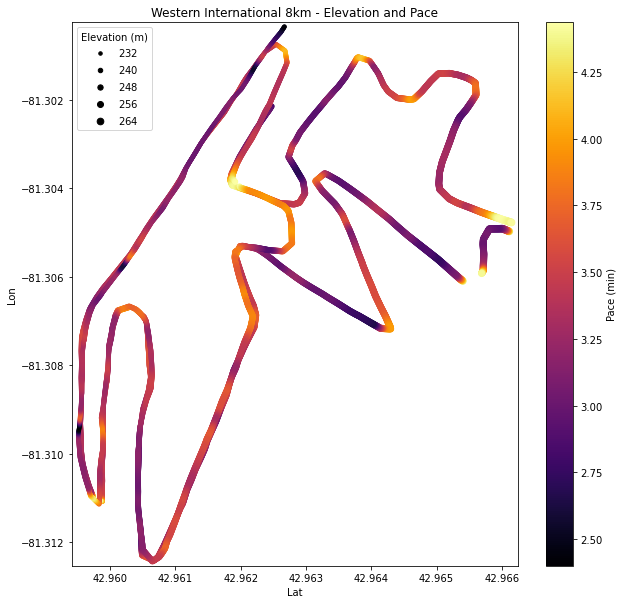

Course average grade adjusted pace - Strava, Minetti
1.831842239444754 1.068569160448816
Bayfront Park 7km.gpx
Total Time :  29  min  39  sec 
Number of hairpins in course
19


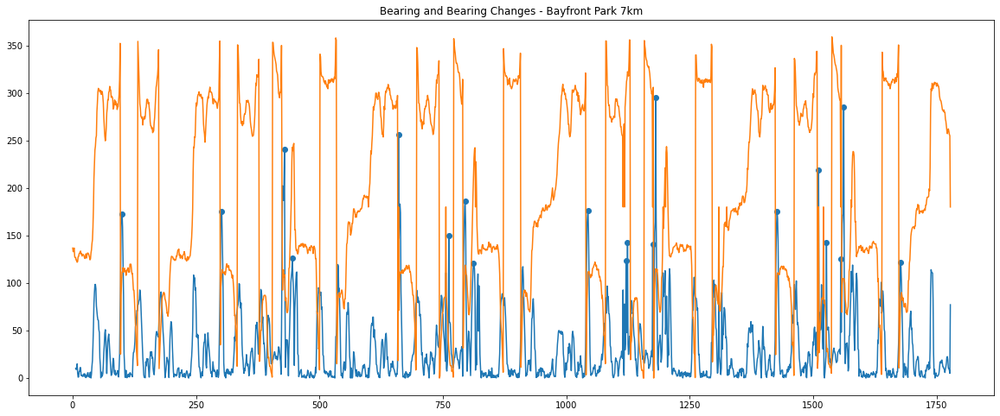

Standard Deviation
38.154109517206564
Total Degrees Turned
56106.85330601091
Race Distance/area of the course are 8304.209 m / -143937.6 m^2


/Users/jeremywalsh/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


10007
9961
9981


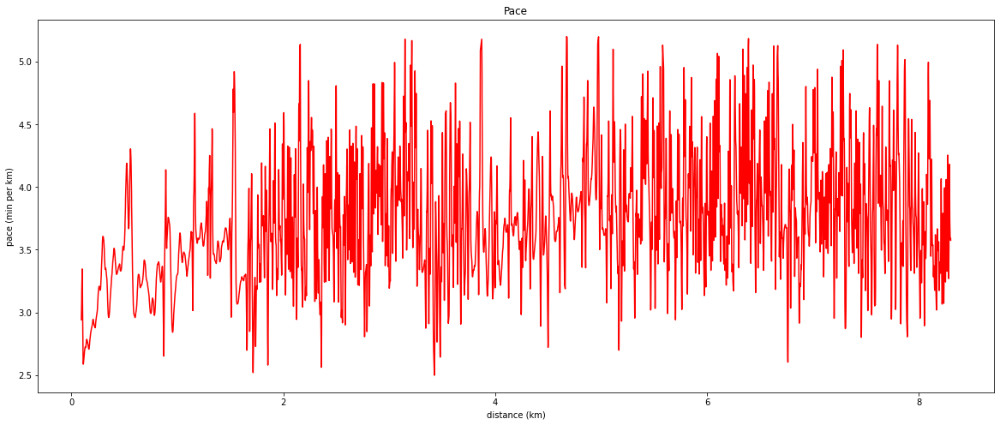

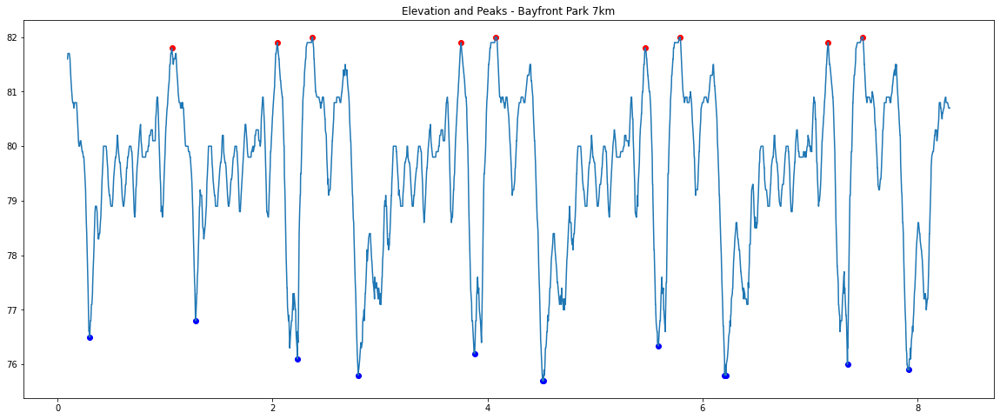

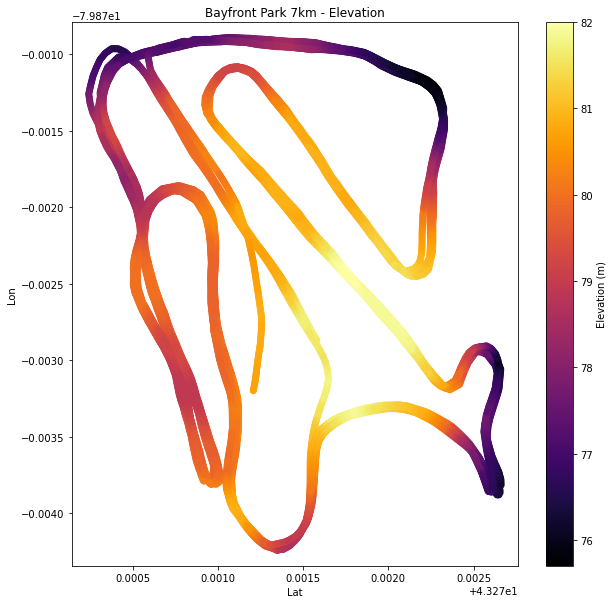

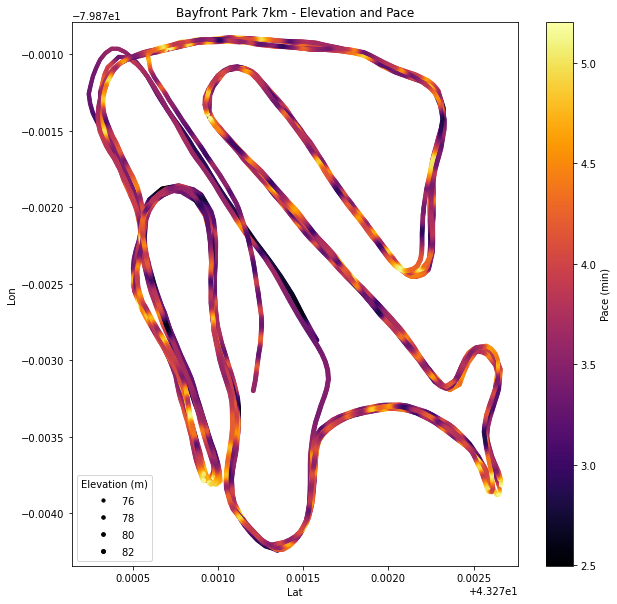

Course average grade adjusted pace - Strava, Minetti
-17.863392684946145 33.42535673304508


In [26]:
path = '/Users/jeremywalsh/Documents/Projects/XC/XCCourseAnalysis/Courses/'
directory = os.fsencode(path)
    
courses = []
st_devs = []
tot_deg_turneds = []
perims = []
areas = []
num_hairpins = []
dfs = []
tallest_hills = []
num_hills_list = []
turn_st_devs = []
hill_st_devs = []
tot_elev_gains = []
tot_elev_gain_unfiltereds = []
hill_dfs = []
lengthoftallesthill = []
start_loc_list = []
start_lat_list = []
start_lon_list = []
courseAverageGradeAdjustedPaceStrava_List = []
courseAverageGradeAdjustedPaceMinetti_List = []

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    if filename.endswith(".gpx"): 
        
        print(filename)
        
        base=os.path.basename(path + filename)
        course = os.path.splitext(base)[0]
        courses.append(course)
        
        gpx_file = path + filename
        df = load_run_to_df(gpx_file)

        df['DistanceChangeInKM'] = df['Distance']-df['Distance'].shift()
        
        HairpinLengthInMeters = 30
        HairpinWindow = round(HairpinLengthInMeters/(df['DistanceChangeInKM']*1000).mean())
        # window = 20 # meters long to consider a hairpin turn complete
        df, bearing = angle_diff(df, HairpinWindow)
        
        height = 120 #number of degrees in a hairpin turn over the window length
        turn_st_dev, tot_deg_turned, num_peak = hairpin_detection(df, height, bearing, course)
        
        perim, area = course_area(geod, df)
        
        turn_st_devs.append(turn_st_dev)
        tot_deg_turneds.append(tot_deg_turned)
        perims.append(perim)
        areas.append(area)
        num_hairpins.append(num_peak)
        
        df.set_index('Distance', inplace=True)
        
        # Interpolate
        df = InterpolateGPS(df)
        
#         df = add_alt_time_dif(gpx, df)
        if df['time'].isnull().all() == True:
            print('no time')
        else:
            df = add_pace(df)
        
         
#         course_max_min(df) #plot the course max and min
        
#         #get the hills
#         min_vals, max_vals, hill_climbs, hill_lengths, df = hills(df)
#         print('hills')
#         print(hill_climbs, hill_lengths)
        
        hill_min_height = 5
        length_of_hill = 5
        hill_st_dev, peaks, mins, tot_elev_gain, tot_elev_gain_unfiltered = hills_peaks(df, hill_min_height, length_of_hill, course)
        hill_st_devs.append(hill_st_dev)
        tot_elev_gains.append(tot_elev_gain)
        tot_elev_gain_unfiltereds.append(tot_elev_gain_unfiltered)
        
        min_vals, max_vals, hill_climbs, hill_lengths = hill_details(df, peaks, mins)
        hill_grade = np.divide(hill_climbs, hill_lengths)*100
        # put all of the hill details into a dataframe of some sort so that we can compare the different sites
        hill_df = pd.DataFrame({'Hill Height': hill_climbs, 'Hill Distance': hill_lengths, 'Hill Grade': hill_grade})
        #drop hills with too low of a grade
        hill_df.drop(hill_df[hill_df['Hill Grade'] < 1].index, inplace=True)
        hill_df.reset_index(drop=True, inplace=True)
        num_hills = len(hill_df)
        
        #list of tallest hill for each course
        tallest_hills.append(hill_df['Hill Height'].max())
        if len(hill_df)>0: #check if there are any hills
            lengthoftallesthill.append(hill_df[hill_df['Hill Height']==max(hill_df['Hill Height'])]['Hill Distance'].min())
        else:
            lengthoftallesthill.append(np.nan)
        hill_dfs.append(hill_df)
        num_hills_list.append(num_hills)
        
        def FirstNotNullInColumn(Column):
            return Column.loc[~Column.isnull()].iloc[0]
        
        start_lat_list.append(FirstNotNullInColumn(df['Lat']))
        start_lon_list.append(FirstNotNullInColumn(df['Lon']))
        
        #Add in more columns
#         df = add_accuDist(df)
#         df = add_pace(df)
        # Couple plots
        elev_map(course, df)
        
        if df['time'].isnull().all() == True:
            print('no time')
        else:
            pace_elev_map(course, df)
            
        #try Grade Adjusted Pace
        import GradeAdjustedPace
        GAP = GradeAdjustedPace.GAP(df)
        courseAverageGradeAdjustedPaceStrava = GAP.getStravaCourseGAP()
        courseAverageGradeAdjustedPaceMinetti = GAP.getMinettiCourseGAP()
        print('Course average grade adjusted pace - Strava, Minetti')
        print(courseAverageGradeAdjustedPaceStrava, courseAverageGradeAdjustedPaceMinetti)
        courseAverageGradeAdjustedPaceStrava_List.append(courseAverageGradeAdjustedPaceStrava)
        courseAverageGradeAdjustedPaceMinetti_List.append(courseAverageGradeAdjustedPaceMinetti)
        
        dfs.append(df)
        
course_info_df = pd.DataFrame({'Course': courses, 'Turn Stdev': turn_st_devs, 
                               'Total Degrees Turned': tot_deg_turneds, 'Perimeters/Total Distance': perims,
                              'Course Area (m^2)': areas, 'Number of Hairpin Turns': num_hairpins, 'Hill Stdev': hill_st_devs,
                              'Tallest Hill (m)': tallest_hills, 'Length of tallest hill (m)': lengthoftallesthill, 'Number of Hills': num_hills_list,
                              'Total Elevation Gain (m)': tot_elev_gains, 'Total Elevation Gain Unfiltered (m)': tot_elev_gain_unfiltereds,
                              'Start Lat': start_lat_list, 'Start Lon': start_lon_list, 'Course Ave. GAP - Strava': courseAverageGradeAdjustedPaceStrava_List,
                              'Course Ave. GAP - Minetti': courseAverageGradeAdjustedPaceMinetti_List})
course_info_df['Course Area (m^2)'] = course_info_df['Course Area (m^2)'].abs() #sometiems area is negative


In [27]:
# course_info_df.sort_values(by=['Total Elevation Gain (m)'], ascending=False)
course_info_df

,Course,Turn Stdev,Total Degrees Turned,Perimeters/Total Distance,Course Area (m^2),Number of Hairpin Turns,Hill Stdev,Tallest Hill (m),Length of tallest hill (m),Number of Hills,Total Elevation Gain (m),Total Elevation Gain Unfiltered (m),Start Lat,Start Lon,Course Ave. GAP - Strava,Course Ave. GAP - Minetti
0,King City 10km,18.538449,10872.224942,10038.907997,950170.390341,4,6.439814,31.700000,0.894961,8,2727.9,2897.610163,43.958538,-79.513373,1073.531823,-976.706190
1,Western International 10km,25.087925,10432.960096,9968.833143,460036.173499,4,8.958747,28.300000,0.624000,9,2986.2,3191.301824,42.962418,-81.301822,-53.716156,87.114164
2,Louisville Classic 8km,19.738023,6781.403288,8540.026287,643863.731242,0,2.987805,13.400000,2.369120,2,651.6,1074.025532,38.281832,-85.556895,1.054198,1.021090
3,Fort Henry 10km,25.759715,11634.607874,10110.727004,324374.359032,4,1.630665,9.200000,1.287430,3,1068.3,1329.333220,44.236265,-76.460620,1.016291,1.015434
4,Point Pleasant Park,34.124293,15666.400836,9724.775310,228902.224241,16,8.122114,17.200000,0.445803,8,2263.5,2616.215501,44.618740,-63.565790,42.698570,-30.216389
5,Malden Park 10km,22.863487,12617.610143,9634.529662,651923.814169,5,3.684066,6.100000,0.341589,1,1314.0,1770.651961,42.279559,-83.068669,-5.212872,13.498179
6,Moncton Classic 8km,28.408747,12423.227402,8300.695758,112459.945592,4,1.616720,6.900000,1.123406,3,546.3,749.007982,46.106609,-64.784758,-14505.365489,17278.672952
7,Guelph Arboretum 7_5km,25.001218,8124.119437,7500.441631,523345.157986,0,4.846169,12.700000,0.320015,8,1439.1,1754.108838,43.541459,-80.223312,109416.270376,-109539.812974
8,Fanshawe Invitational 8km,24.180206,8634.827413,8126.288553,609178.006826,4,2.476633,10.600000,2.082113,6,1240.2,1416.372596,43.058170,-81.183843,29.022356,-20.494138
9,StFX Invitational 8km,58.441980,86506.596787,7862.697327,209436.040107,71,4.948747,12.700000,0.441403,8,477.0,838.778387,45.616600,-61.990704,16273.805299,-15843.841782


<AxesSubplot:xlabel='Distance'>

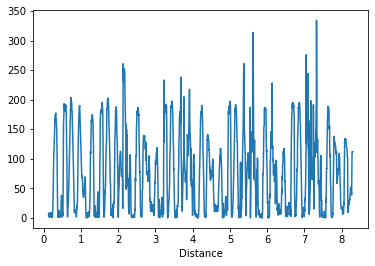

In [ ]:
df['angle_diff'].plot()

# Fix angle diff to be less sensitive and have better hairpin detection. Once it works well alongside hairpin detection, then remove all instances of gpx_interp (sp?) and copy to main